<a href="https://colab.research.google.com/github/kussy29/machine_learning/blob/main/lab08_automatic_gradient_training_loop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Homework Assignment: Working with Other Loss Functions**

-------------------------------

During the class today, we reconstructed an **ellipse**. The ellipse was defined with two **foci** and $C$ (the sum of distances of the ellipse points from the foci).

To reconstruct the ellipse through optimization, we began with **$N$ points** scattered randomly in the 2D plane. Our goal was to adjust their positions so that they satisfy the elliptical constraint as closely as possible. We achieved this by minimizing the **error-related loss**, $L^{(2)}_{\text{ellipse}}$ which was defined in today's class with $\ell_2$ norm as:

$$
L^{(2)}_{\text{ellipse}} = \frac{1}{N} \sum_{i=1}^{N} \epsilon_i^2
$$

where
$$
 \epsilon_i = d_{i1} + d_{i2} - C
$$
where $N$ is the number of points, and $d_{i1}, d_{i2}$ are their distances to the two foci.

In the homework assignment you will experiment with 3 other loss definitions based on some other possible norms.



1. $\ell_0$ norm resulting in
  $$
  L^{(0)}_{\text{ellipse}} = \frac{1}{N} \sum_{i=1}^{N} \mathbf{1}(\epsilon_i \neq 0)
  $$
  - If you actually succeed to code this loss function, the question for you to answer in relation to $L^{(0)}_{\text{ellipse}}$ is why the training is not progressing with passing epochs.
  - If you actually fail to code this loss function, the question for you to answer is to explain the failure and reason out theoretically, why the training would not be progressing with passing epochs, anyway.

1. $\ell_1$ norm resulting in
  $$
  L^{(1)}_{\text{ellipse}} = \frac{1}{N} \sum_{i=1}^{N} |\epsilon_i|
  $$
  The question for you to answer in relation to $L^{(1)}_{\text{ellipse}}$ is why the training loss doesn't converge, even after the ellipse has been fully drawn.

1. $\ell_\infty$ norm resulting in
  $$
  L^{(\infty)}_{\text{ellipse}} =  \max_{i} |\epsilon_i|
  $$
  The question for you to answer in relation to $L^{(\infty)}_{\text{ellipse}}$ is why the training takes so long and it doesn't converge in the end, either.

## **Points to Note**

1. Draw both the shape that the points draw as they move, and the loss value after each epoch, just as we did in class today.

2. Note, that the purpose of this excercise is not that you reconstruct a perfect ellipse, but rather that you give it a try, and even if you fail you should document and explain the failure, and answer a question related to a given loss definition.

3. You can also play around with the learning rate to try to improve convergence.

## **Task & Deliverables**
  
   - Document your experiments (python code and charts) and **write down your conclusions** into the Colab notebook.
   - It is not strictly required, but **if you make a movie showing the optimization progress it will be considered a strong point of your solution**
     - You can make a movie programmatically as we did in clustering class (our second class) with EM clustering,
     - or, you can save to disk the image files with epoch charts and use an external tool to bind them into a movie. Provide links to movie files in the README.
   - Place the Colab notebook  with the solution in your **GitHub repository** for this course.
   - In your repository’s **README**, add a **link** to the notebook (and any movies you created) and also include an **“Open in Colab”** badge at the top of the notebook so it can be launched directly from GitHub.

## Sample code

   You can use the sample code provided below:



In [ ]:
def plot_results(epoch, trajectories, loss_history=None):
    if loss_history is not None:
      fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    else:
      fig, axes = plt.subplots(1, 1, figsize=(6, 6))
      axes = [axes]
    points = np.array([trajectories[i][-1] for i in range(num_points)])
    # Left plot: Scatter of points with trajectories
    axes[0].scatter(points[:, 0], points[:, 1], label=f'Points - Epoch {epoch}')
    f1 = focus1.detach().cpu().numpy()
    f2 = focus2.detach().cpu().numpy()
    axes[0].scatter([f1[0], f2[0]], [f1[1], f2[1]], color='red', marker='x', s=100, label='Foci')

    # Draw movement traces
    for i in range(num_points):
        trajectory = np.array(trajectories[i])
        axes[0].plot(trajectory[:, 0], trajectory[:, 1], color='gray', linestyle='-', linewidth=0.5)

    axes[0].set_xlabel('X')
    axes[0].set_ylabel('Y')
    axes[0].legend()


    axes[0].grid()

    if loss_history is not None:
      axes[0].set_title(f'Points after Epoch {epoch}')
      # Right plot: Loss history
      axes[1].plot(loss_history, color='blue')
      axes[1].set_xlabel("Epoch")
      axes[1].set_ylabel("Loss")
      axes[1].set_title("Loss Convergence")
      axes[1].grid()
    else:
      axes[0].set_title(f'Points before Epoch {epoch}')

    plt.show()

In [ ]:
(torch.abs(dist1 + dist2 - constant_sum)!=0).to(torch.float32).mean()

tensor(1.)

### L_0 loss

$$\frac{dl_0(ϵ)}{dϵ}=0$$
$l_0$ loss is not differentiable at 0 and in every other point gradient is equal 0, so model can't learn anything.

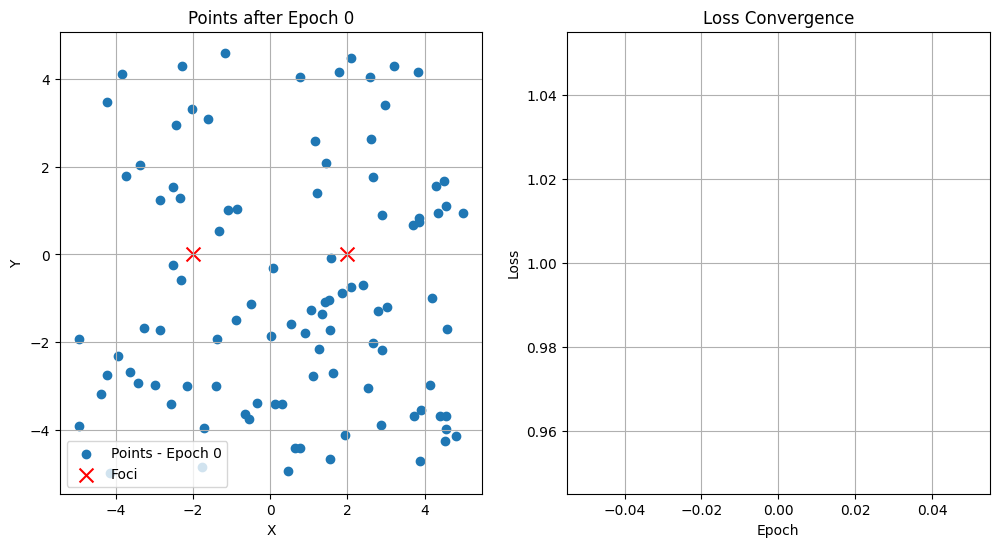

Epoch 0: Loss = 1.000000


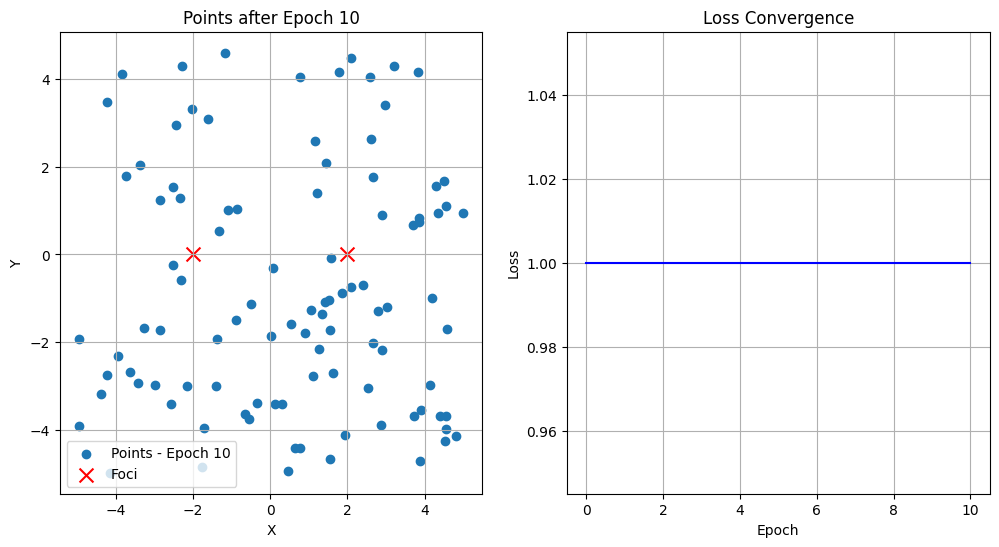

Epoch 10: Loss = 1.000000


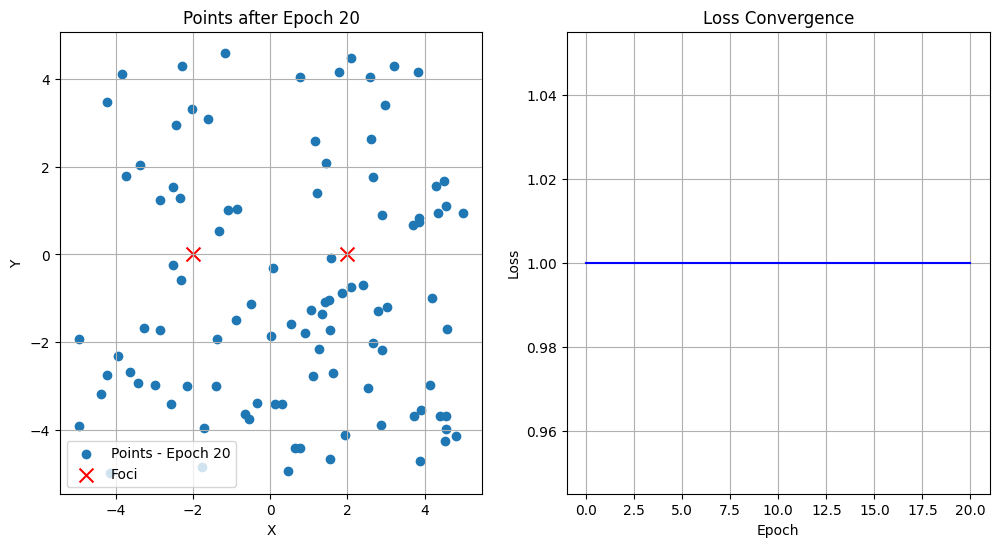

Epoch 20: Loss = 1.000000


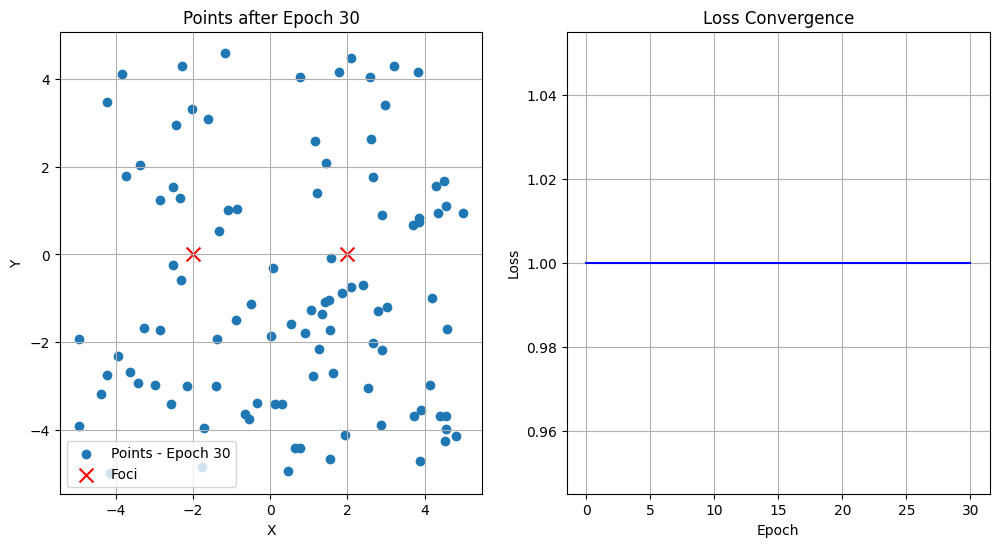

Epoch 30: Loss = 1.000000


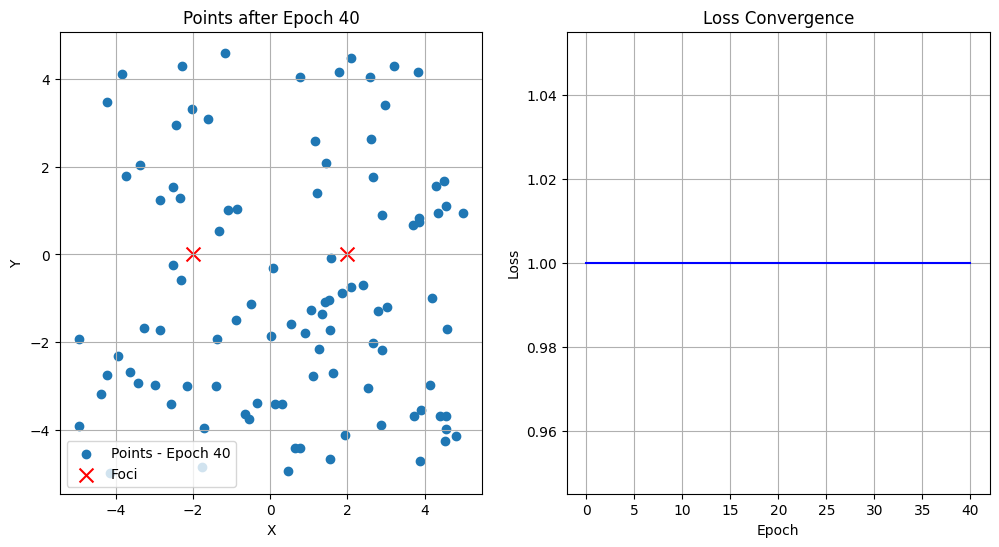

Epoch 40: Loss = 1.000000


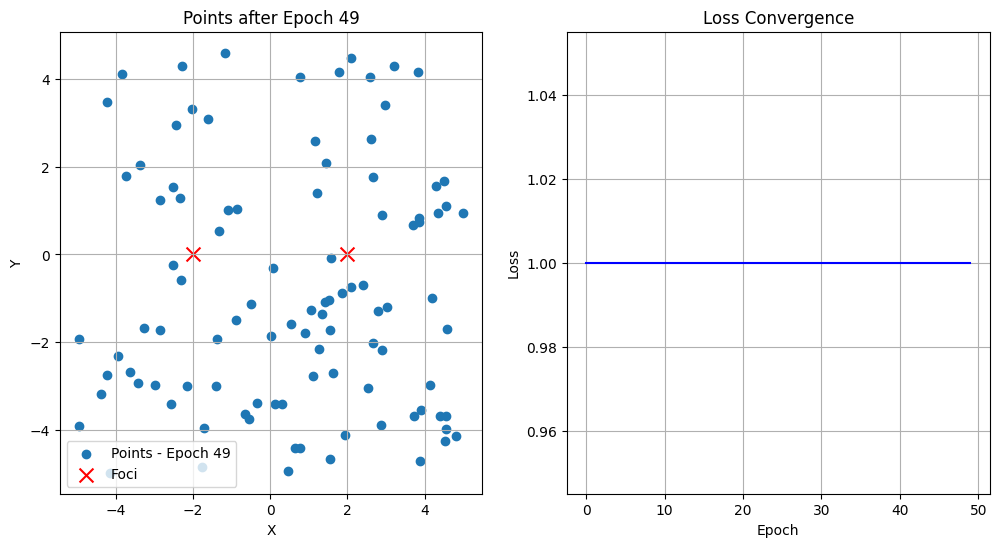

Elapsed time: 2.8753159046173096 seconds


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np


# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)


# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # Compute loss - it is implemented as MSE loss related to l_2 norm
    # TODO: your job is to replace the line below
    # with l_0, l_1 and l_infty - related loss
    loss = (torch.abs(dist1 + dist2 - constant_sum)!=0).to(torch.float32).mean()
    loss.requires_grad = True

    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 10th epoch
    if epoch % 10 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: Loss = {loss.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

### L_1 loss

$$\frac{dl_1(ϵ)}{dϵ_i}=\frac{ϵ_i}{|ϵ_i|}$$

As we can see module of gradient of $l_1$ is always 1 and at 0 it's not differentiable. So step has always length of learning rate even thou we are close to the right answer so it should be much smaller. So best idea is to decrease learning rate rapidly.

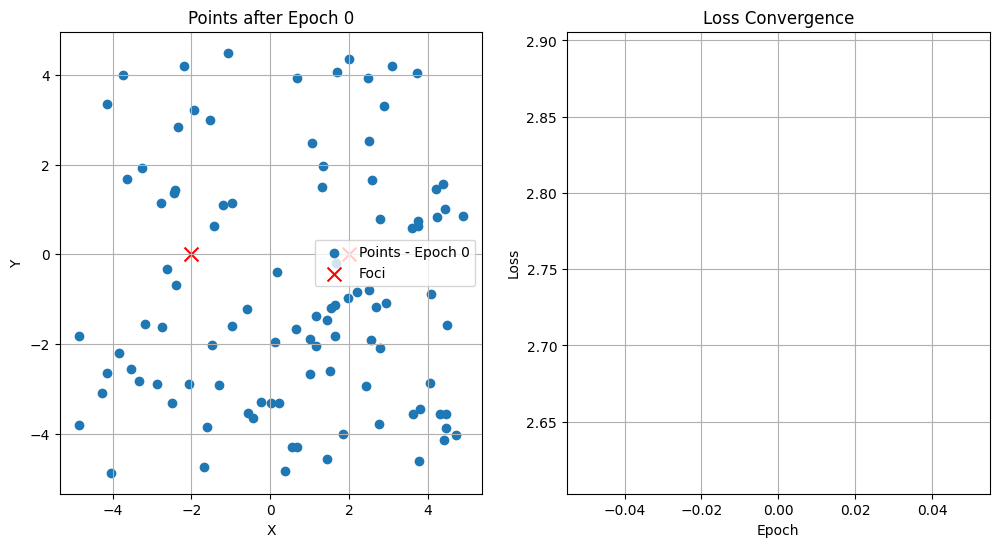

Epoch 0: Loss = 2.754212


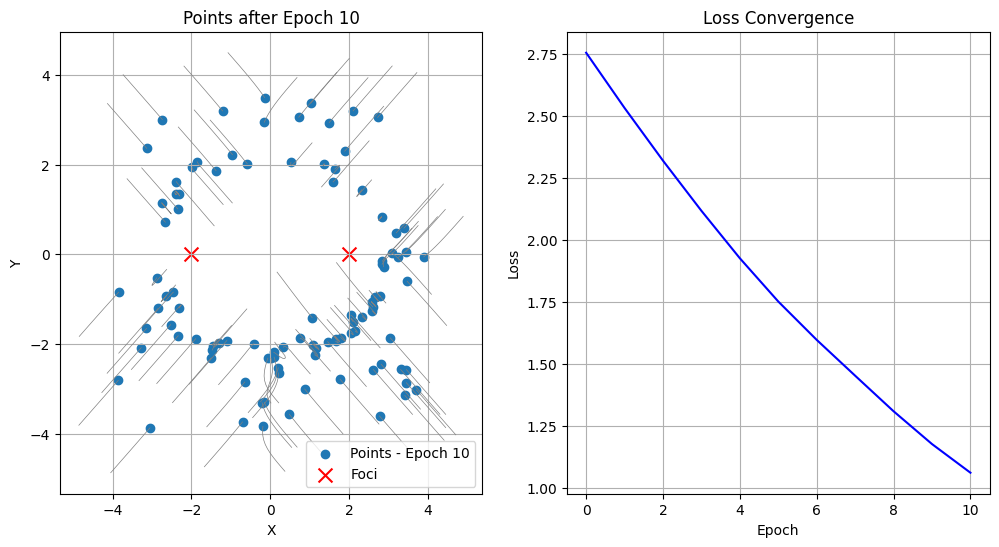

Epoch 10: Loss = 1.059926


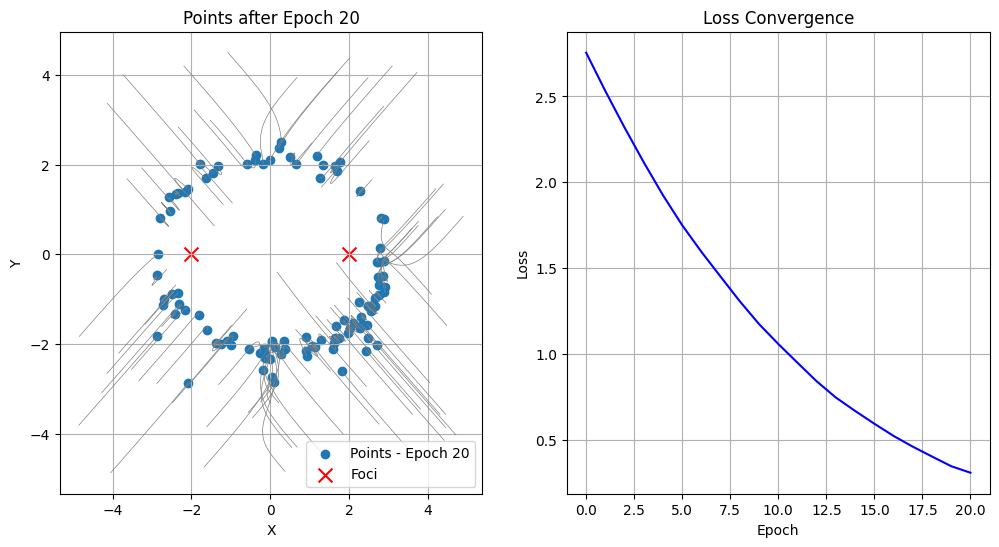

Epoch 20: Loss = 0.310943


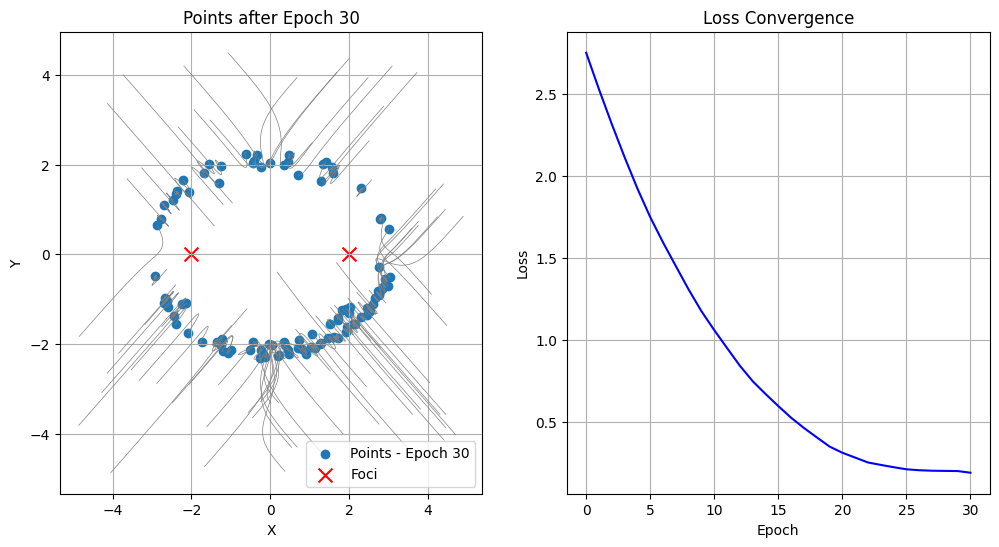

Epoch 30: Loss = 0.188926


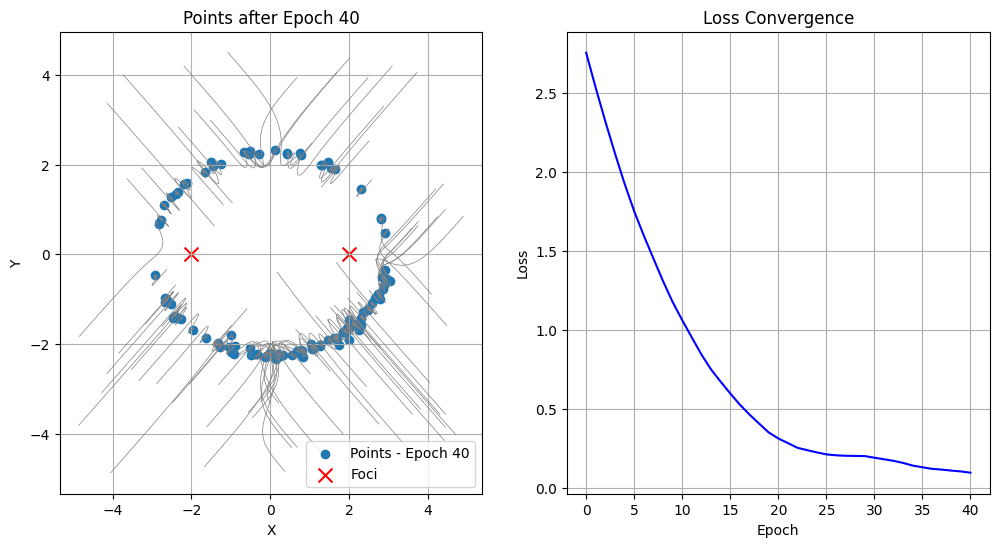

Epoch 40: Loss = 0.093729


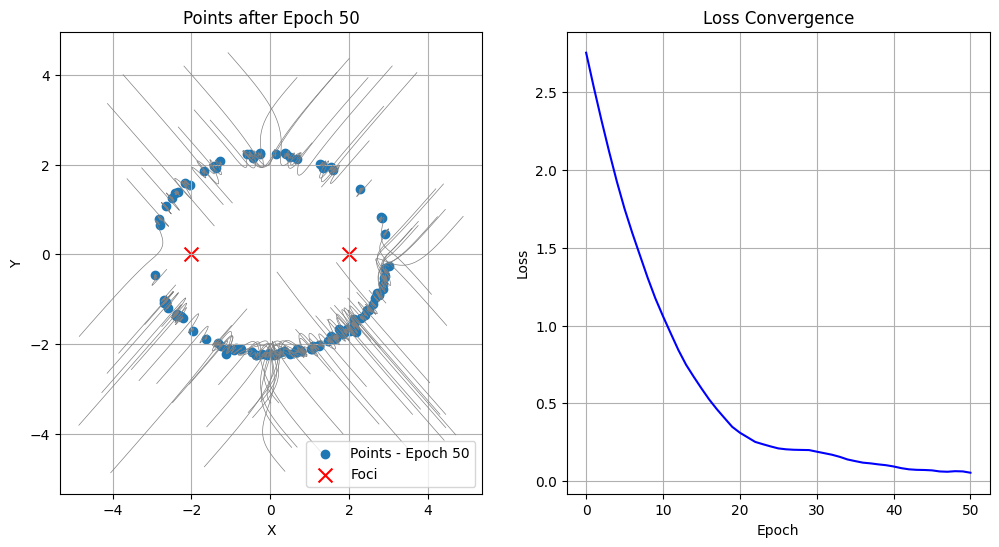

Epoch 50: Loss = 0.053497


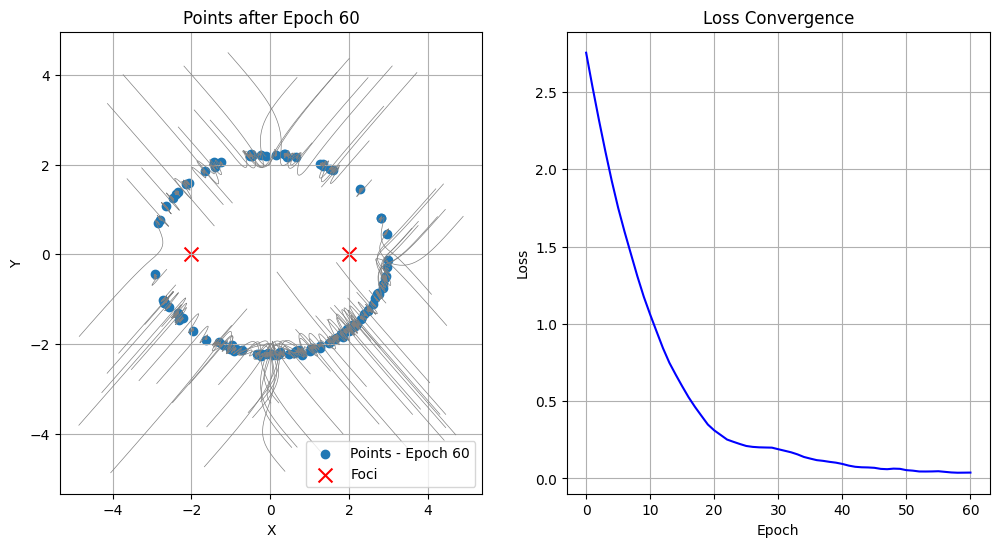

Epoch 60: Loss = 0.037769


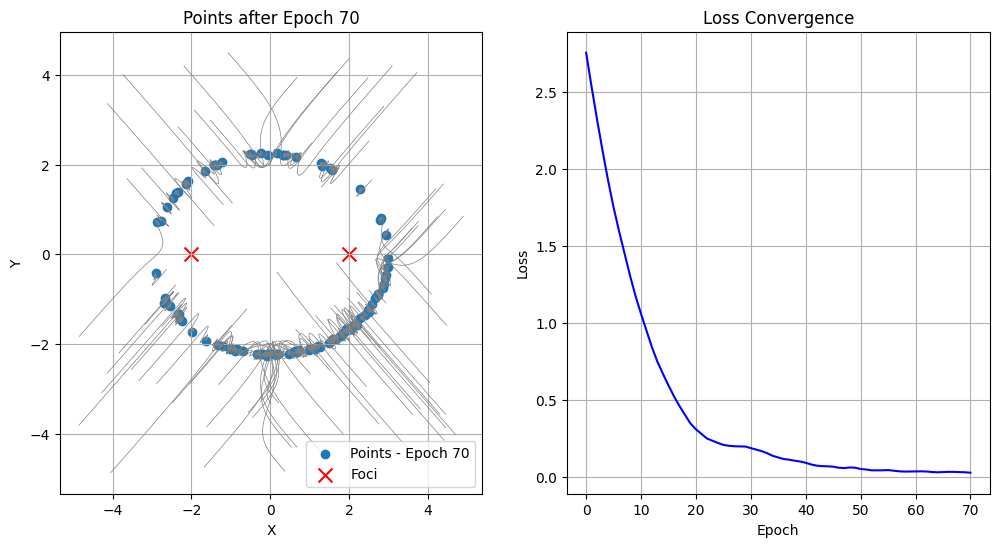

Epoch 70: Loss = 0.029401


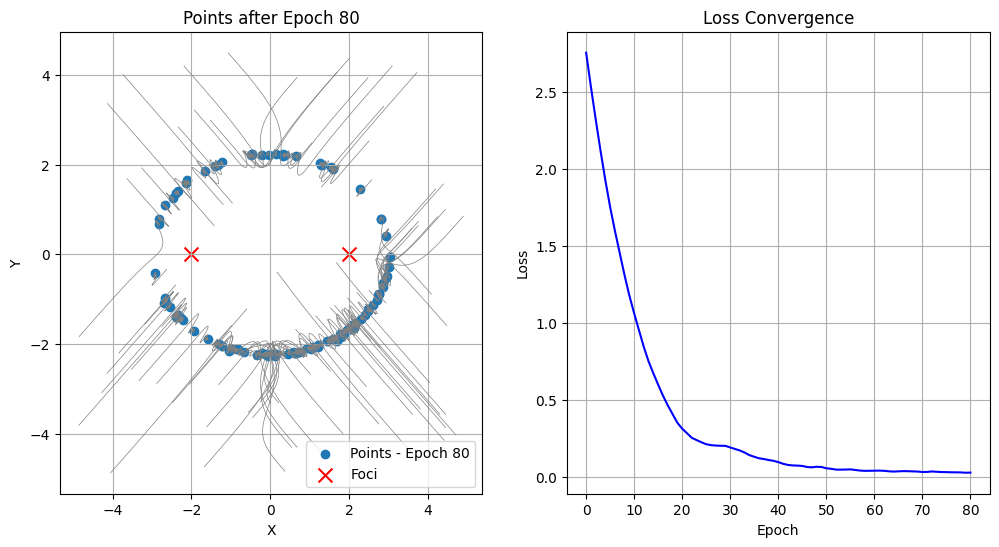

Epoch 80: Loss = 0.025541


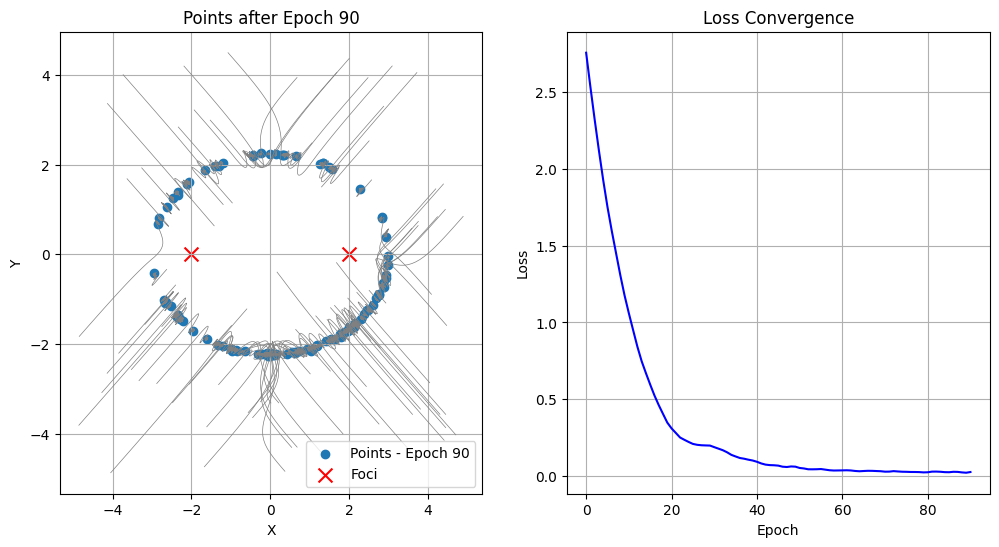

Epoch 90: Loss = 0.026995


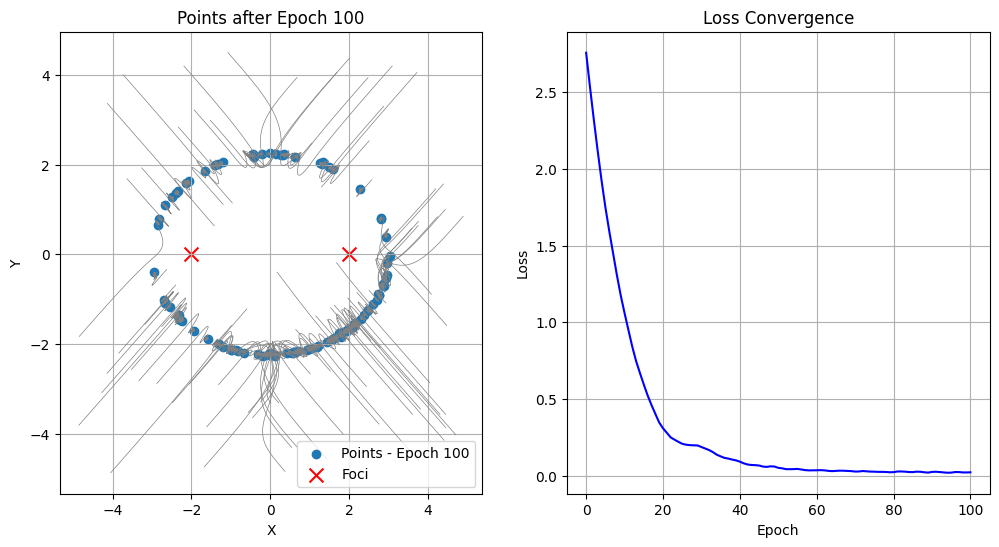

Epoch 100: Loss = 0.024422


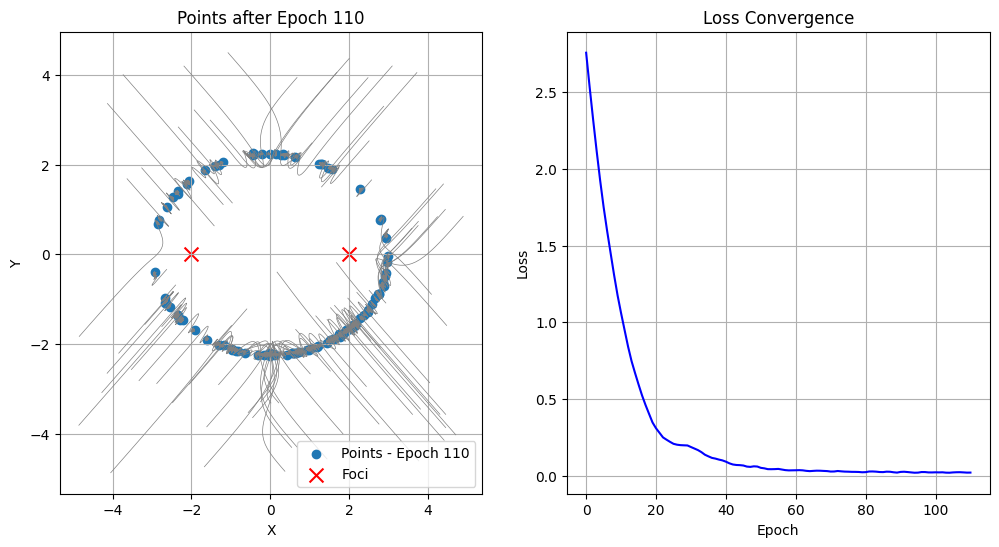

Epoch 110: Loss = 0.022661


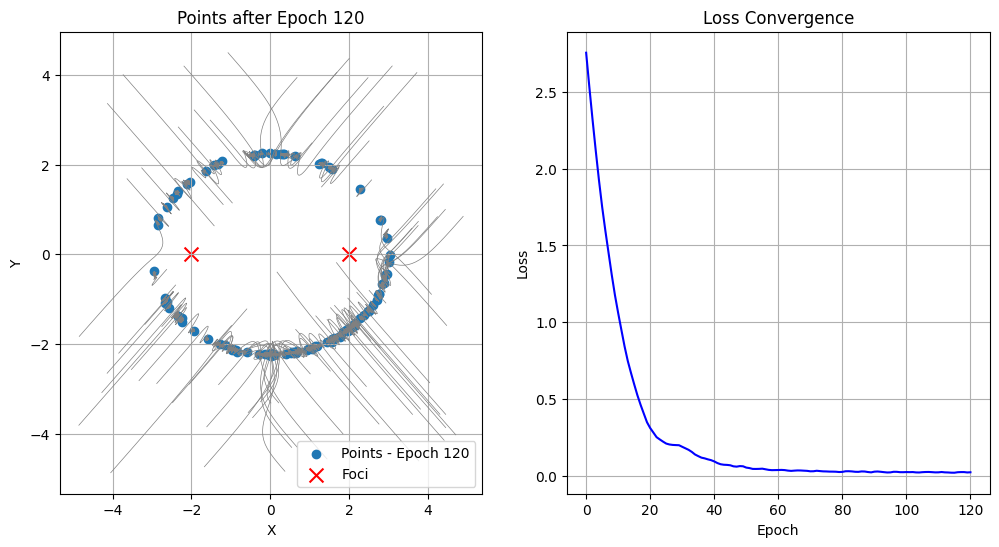

Epoch 120: Loss = 0.023052


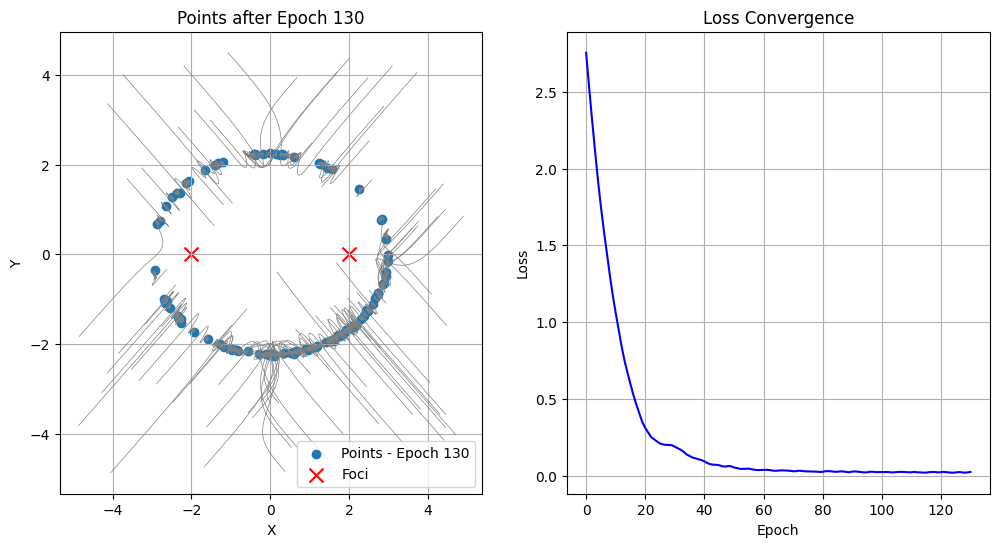

Epoch 130: Loss = 0.024824


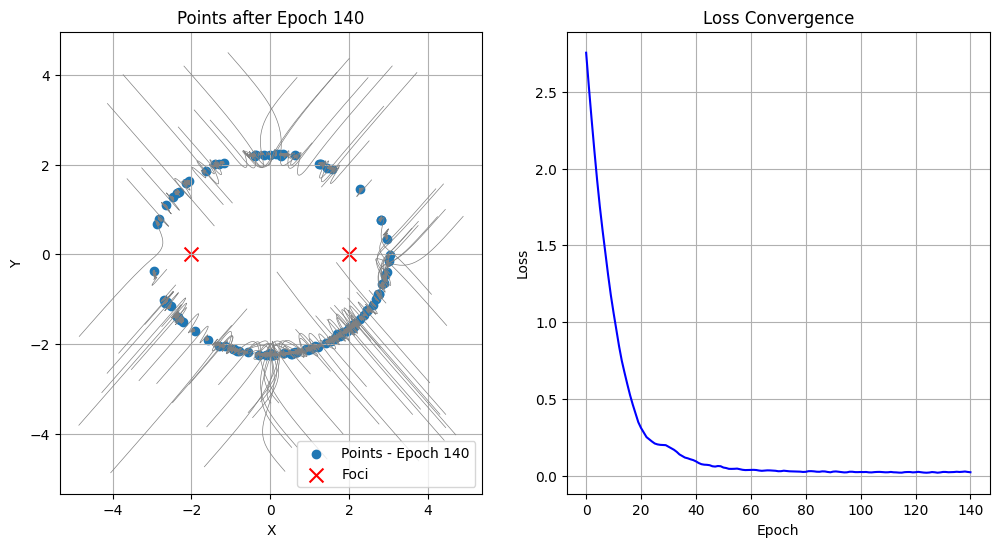

Epoch 140: Loss = 0.022773


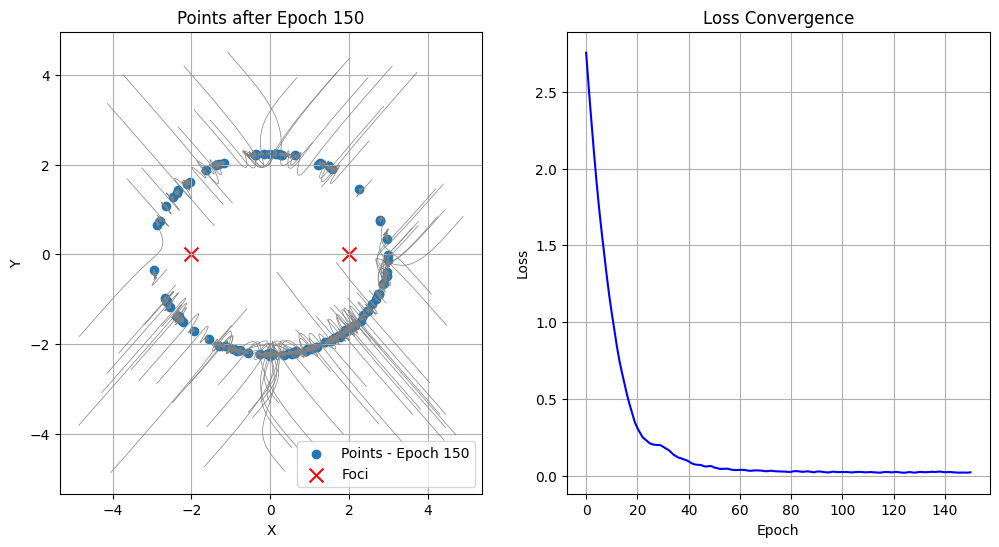

Epoch 150: Loss = 0.022459


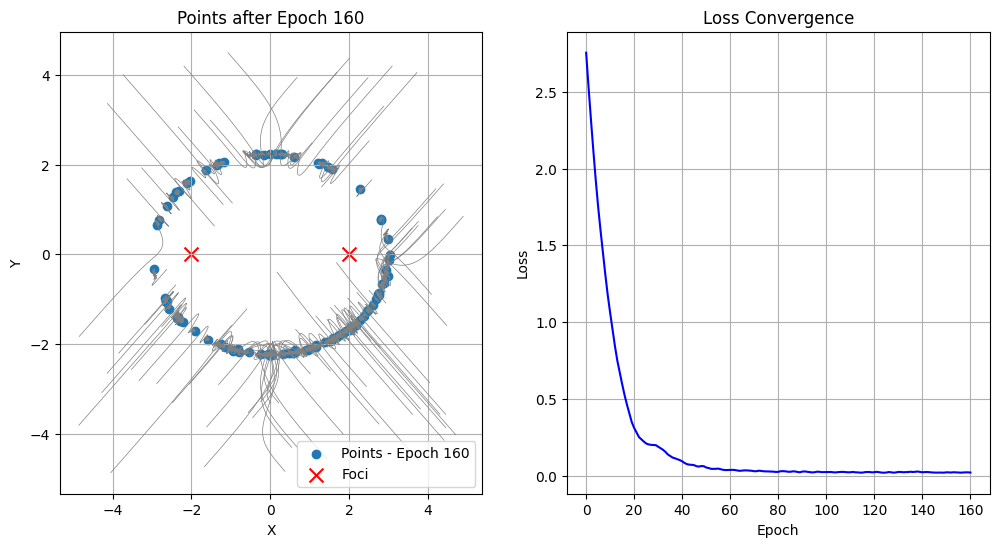

Epoch 160: Loss = 0.020810


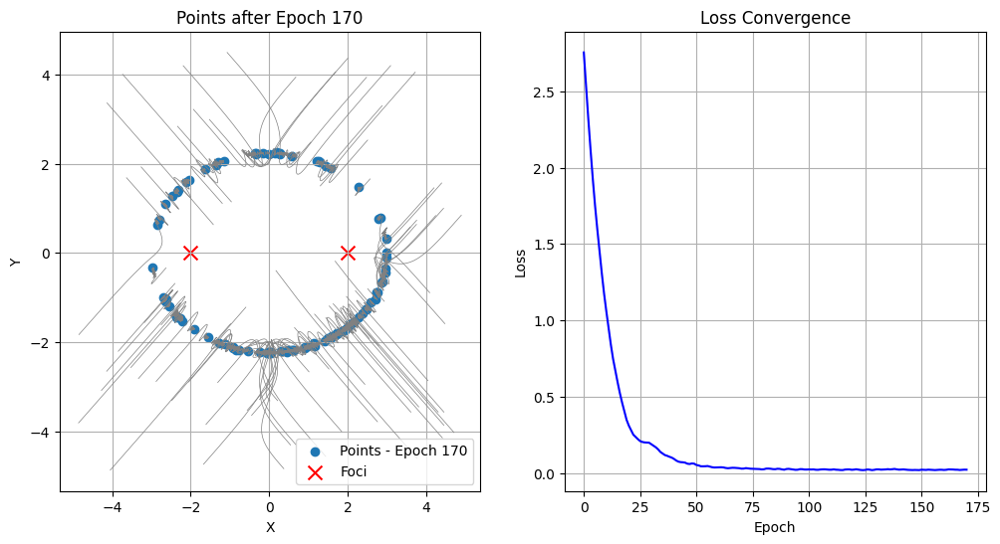

Epoch 170: Loss = 0.022611


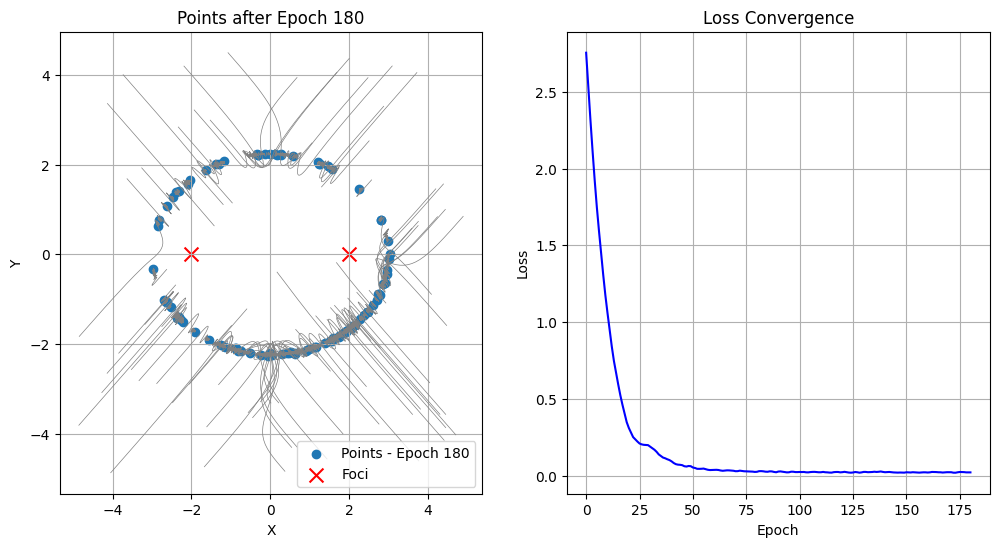

Epoch 180: Loss = 0.021731


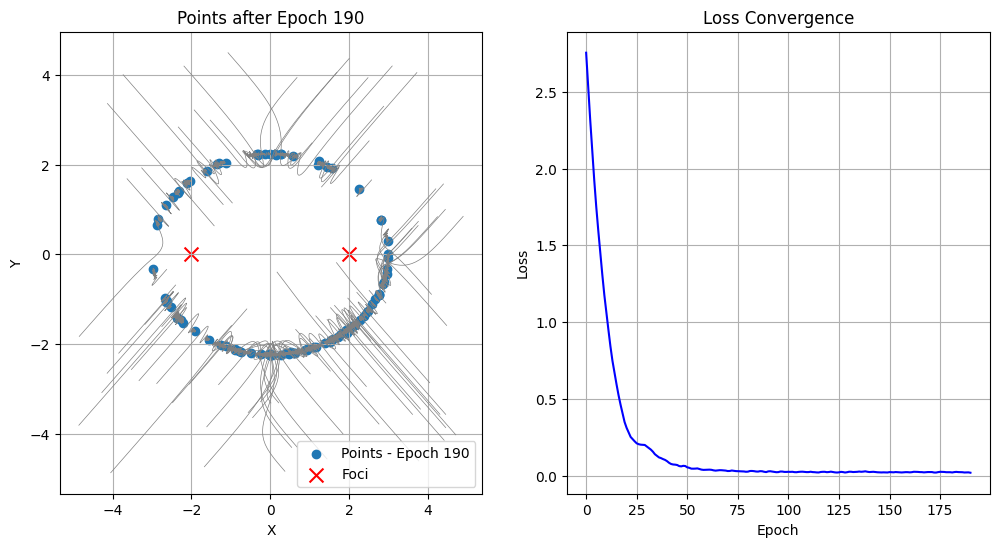

Epoch 190: Loss = 0.018421


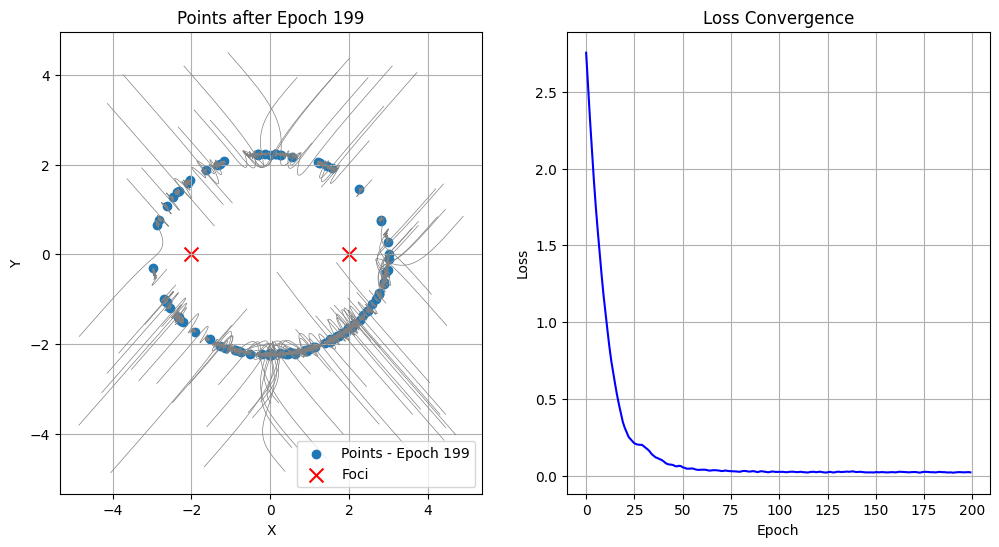

Elapsed time: 11.93543815612793 seconds


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np


# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)


# Training loop
num_epochs = 200
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # Compute loss - it is implemented as MSE loss related to l_2 norm
    # TODO: your job is to replace the line below
    # with l_0, l_1 and l_infty - related loss
    loss = torch.mean(torch.abs(dist1 + dist2 - constant_sum))

    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 10th epoch
    if epoch % 10 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: Loss = {loss.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

We add scheduler to reduce learning rate.

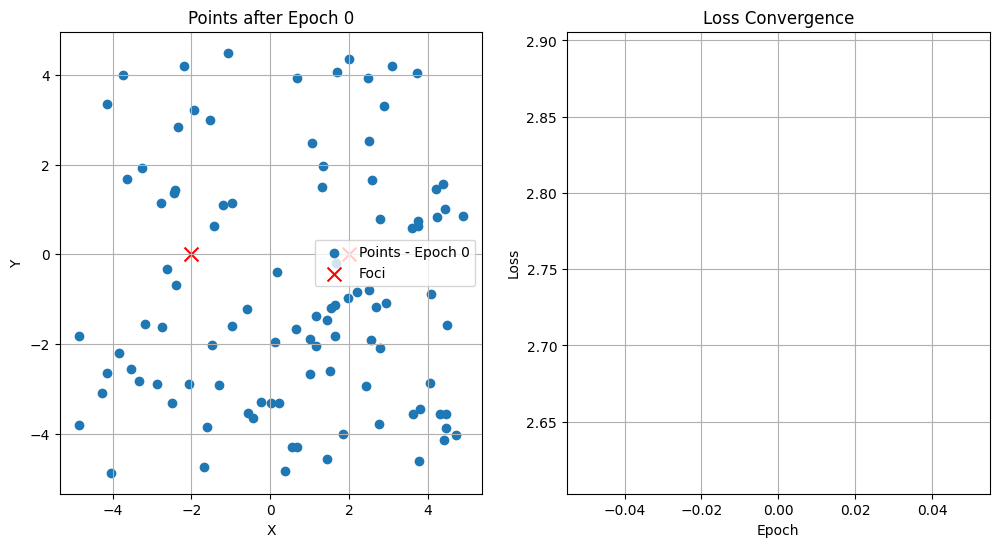

Epoch 0: Loss = 2.754212


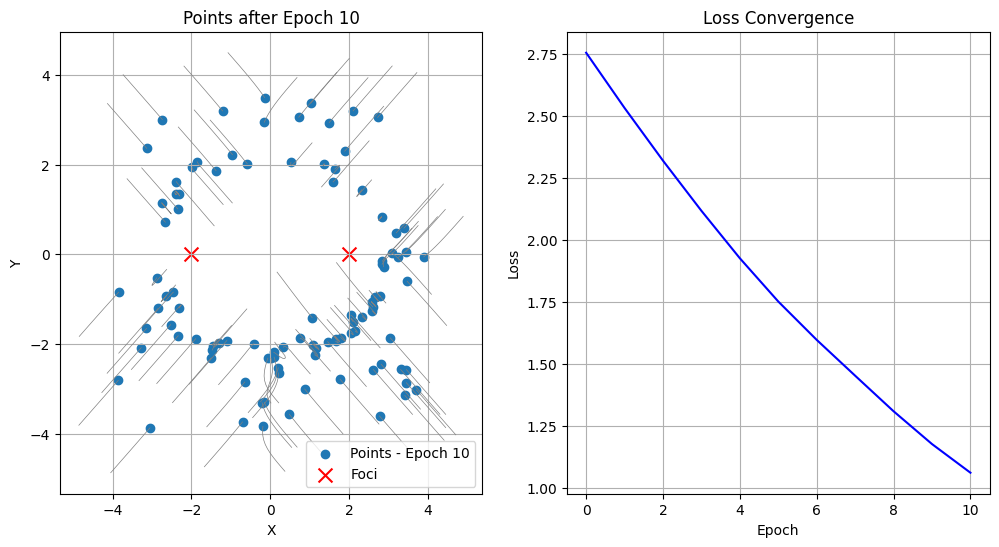

Epoch 10: Loss = 1.059926


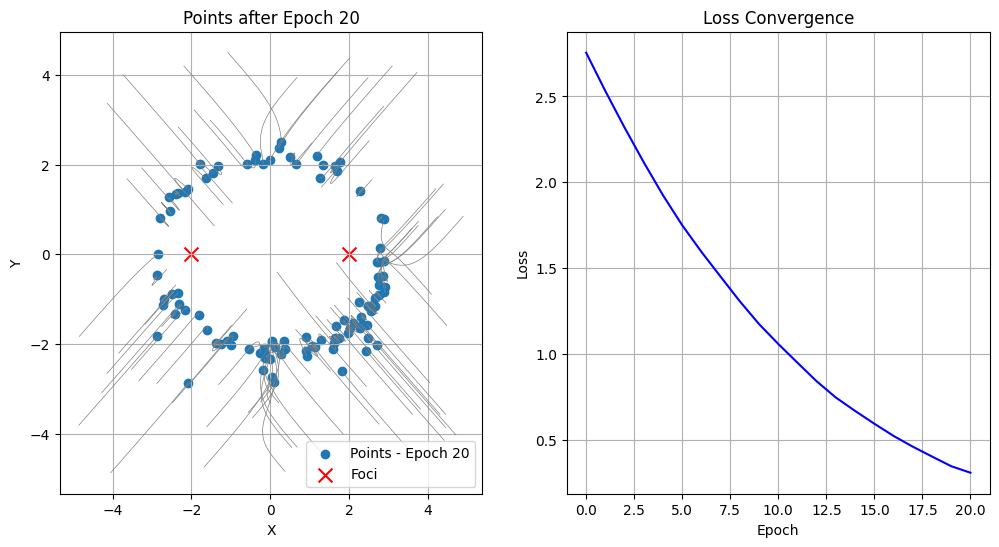

Epoch 20: Loss = 0.310943


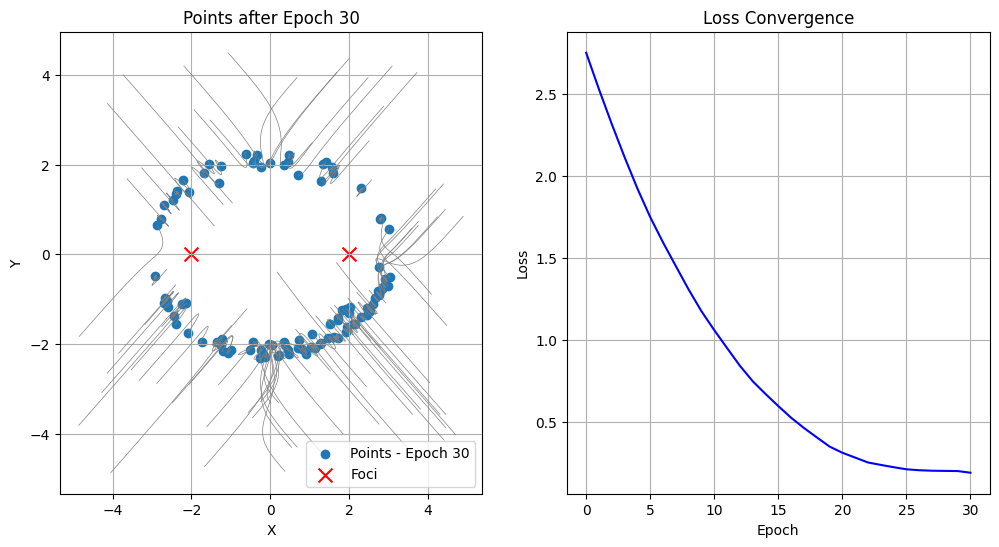

Epoch 30: Loss = 0.188926


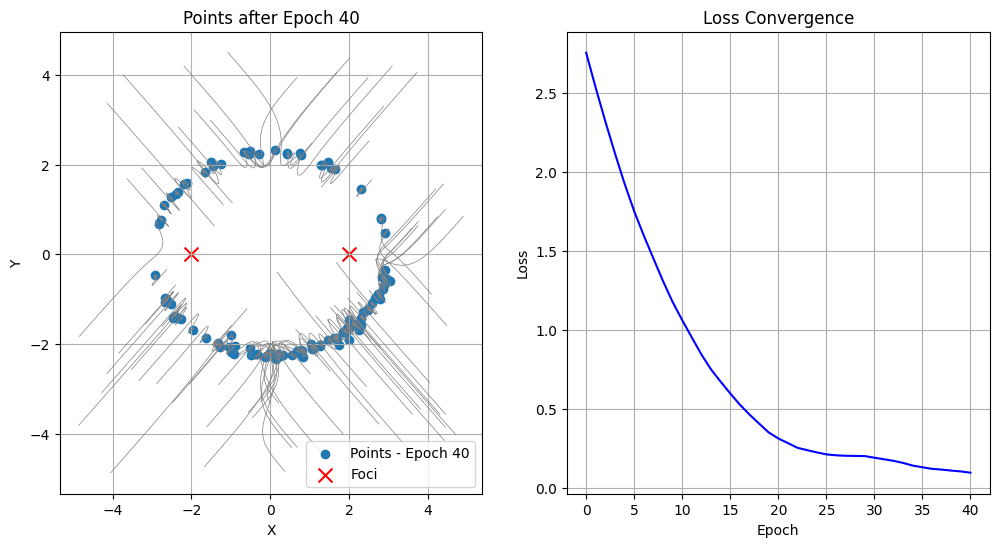

Epoch 40: Loss = 0.093729


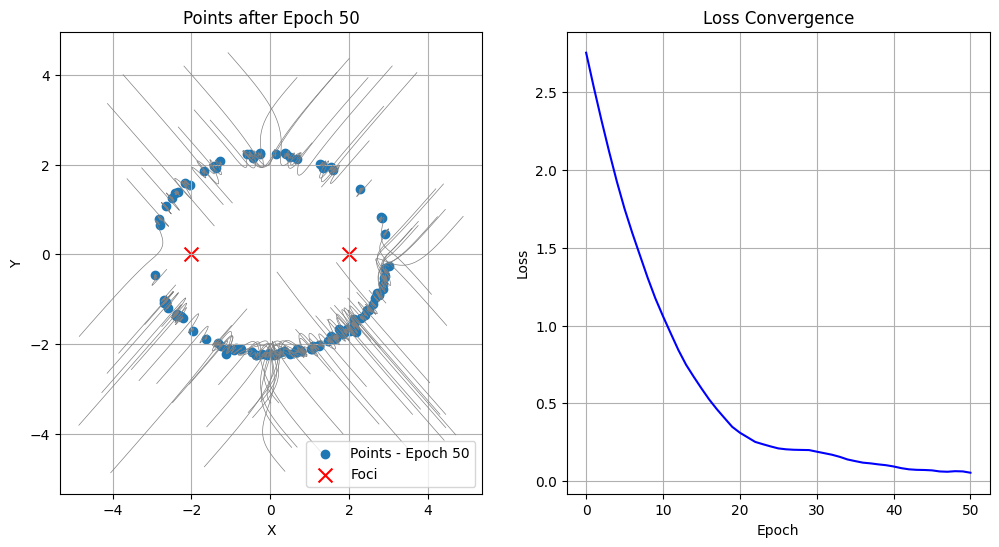

Epoch 50: Loss = 0.053497


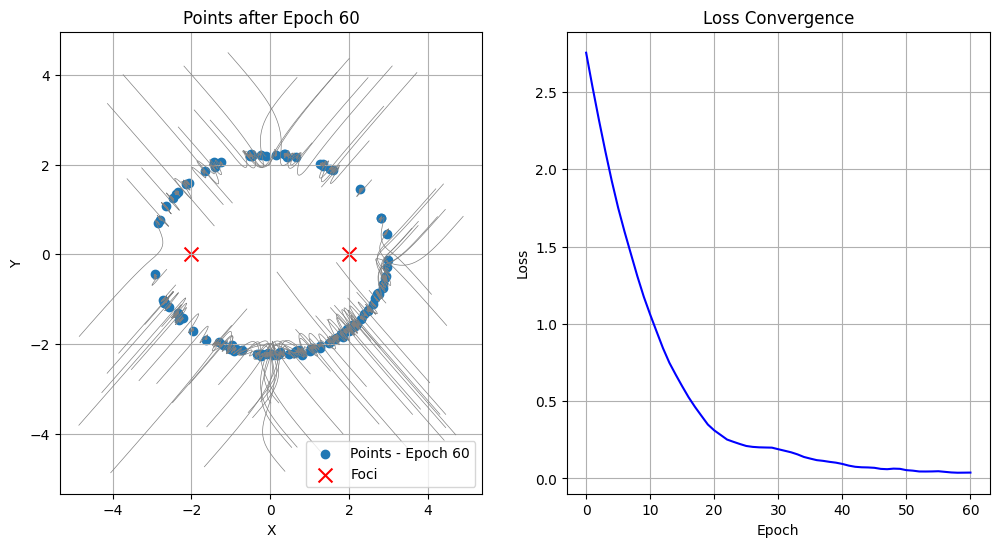

Epoch 60: Loss = 0.037769


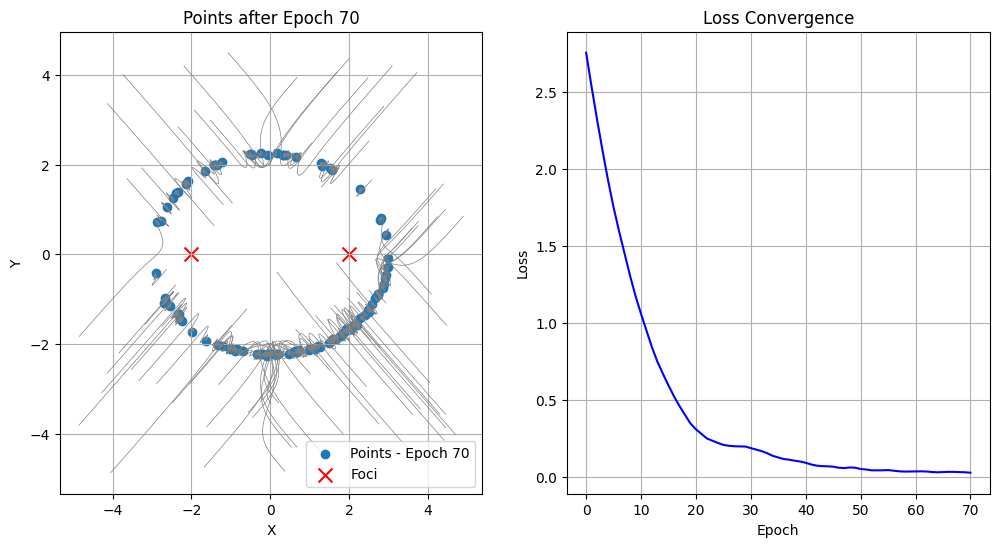

Epoch 70: Loss = 0.029401


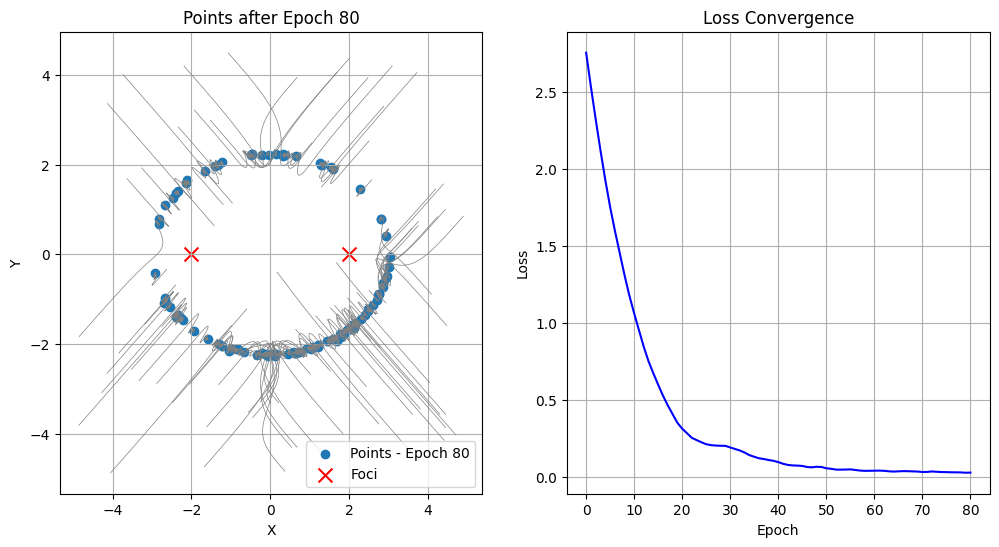

Epoch 80: Loss = 0.025541


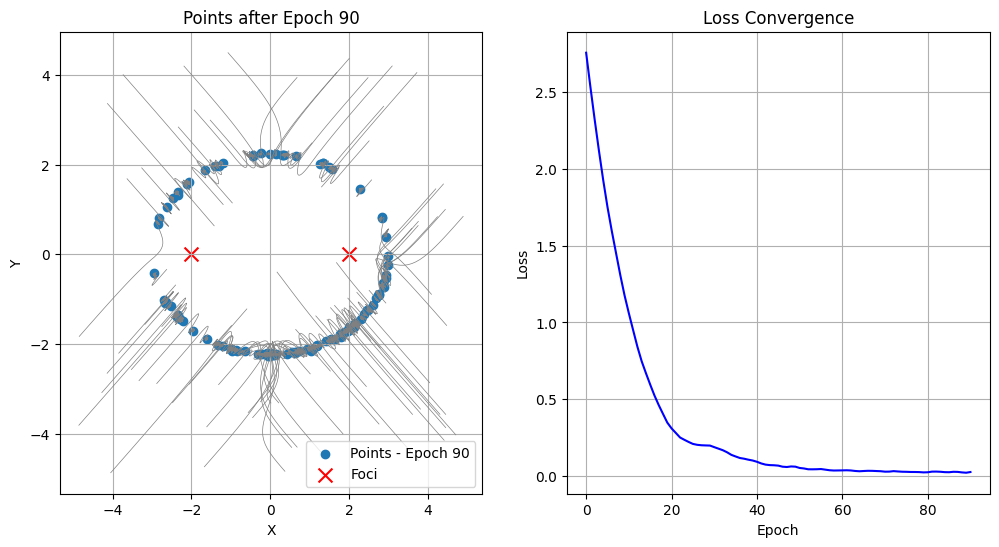

Epoch 90: Loss = 0.026995


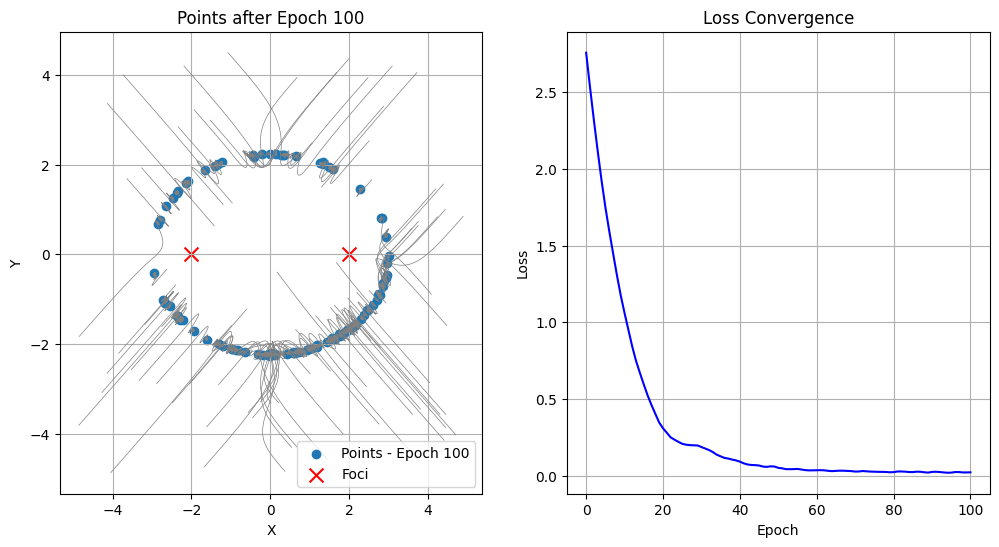

Epoch 100: Loss = 0.024422


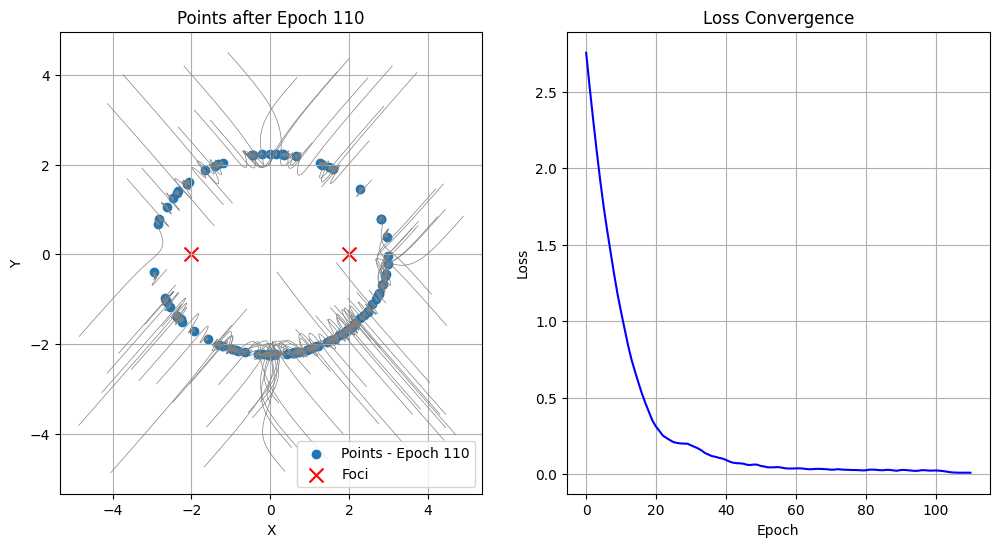

Epoch 110: Loss = 0.009664


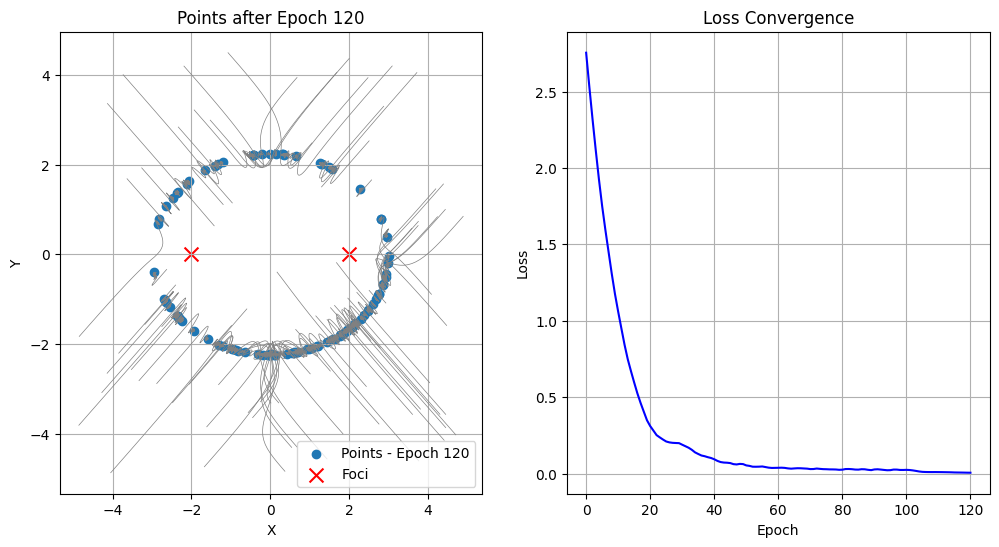

Epoch 120: Loss = 0.005571


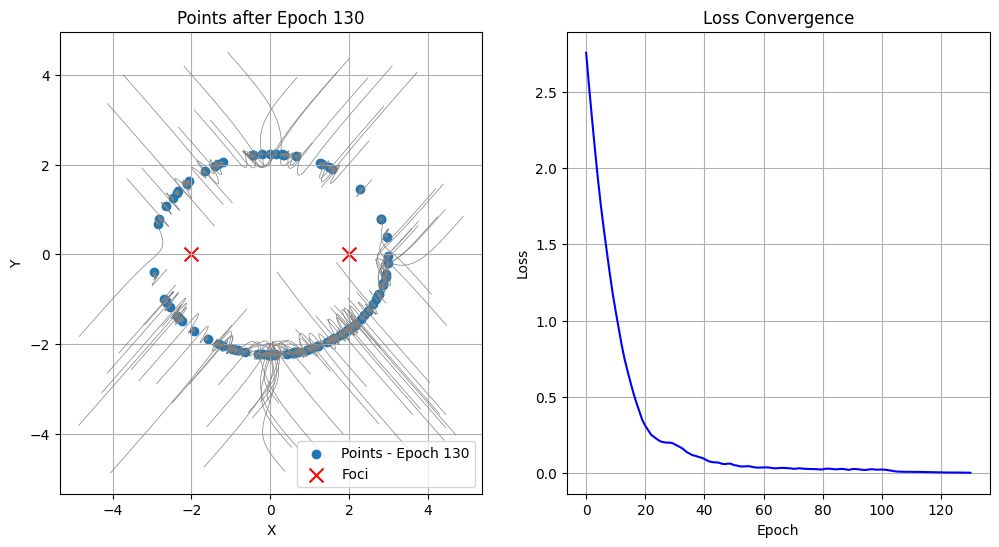

Epoch 130: Loss = 0.003482


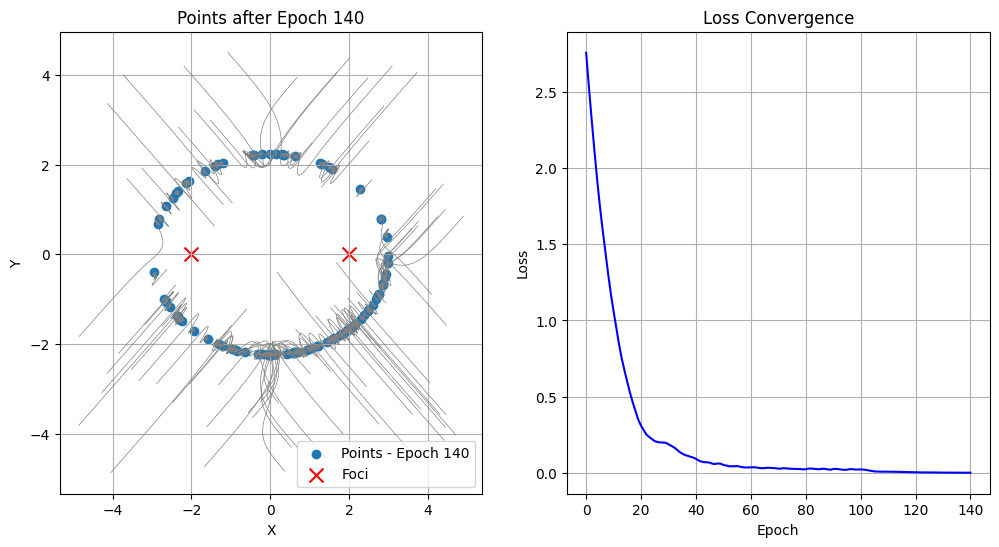

Epoch 140: Loss = 0.002744


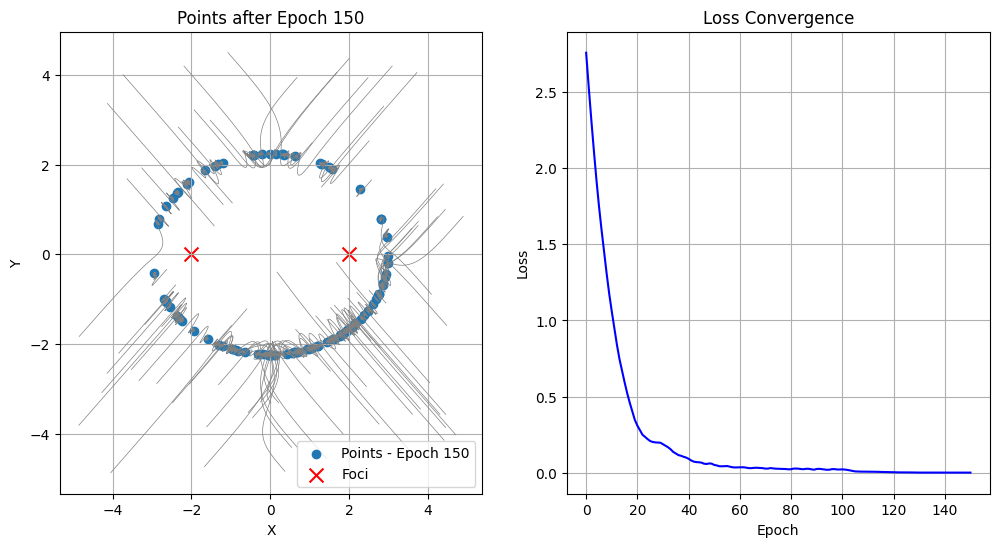

Epoch 150: Loss = 0.003238


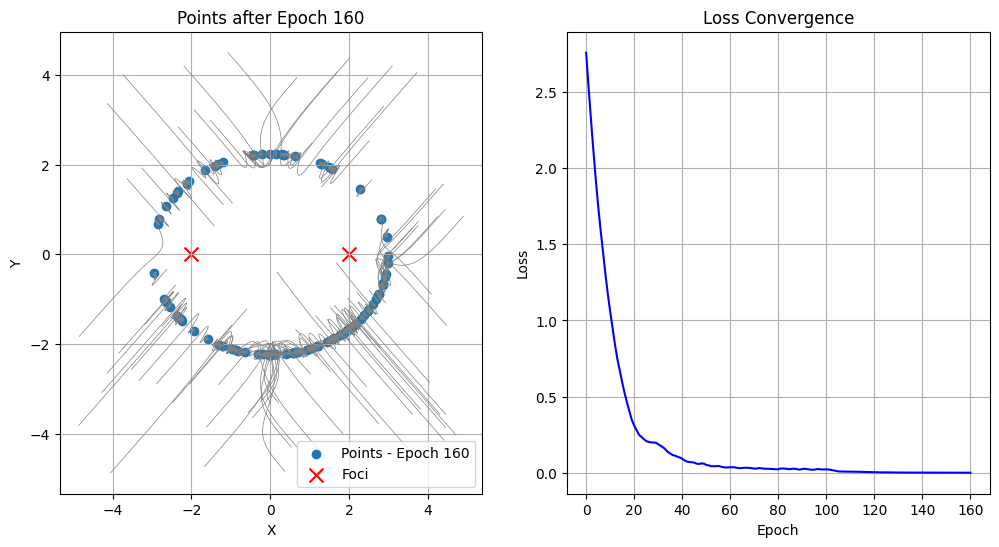

Epoch 160: Loss = 0.002360


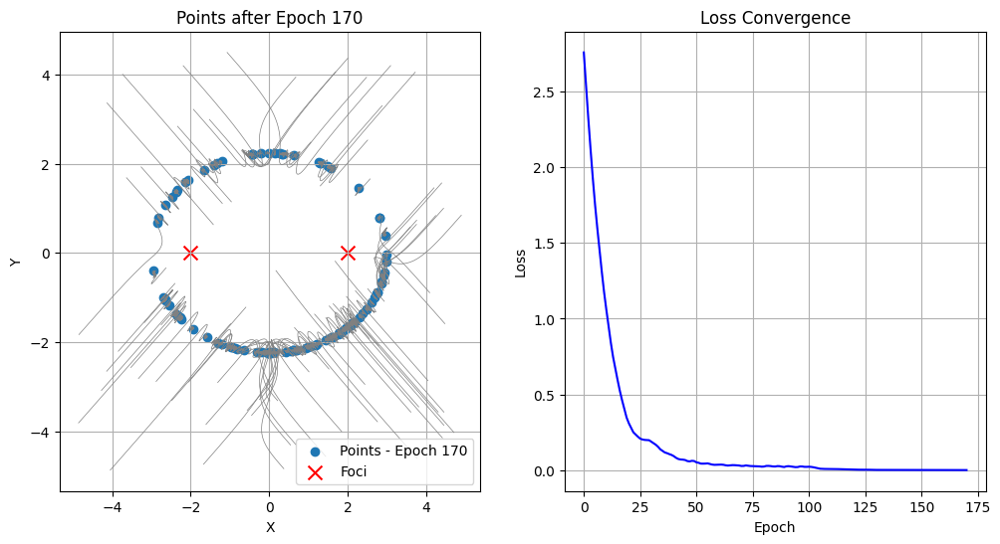

Epoch 170: Loss = 0.002416


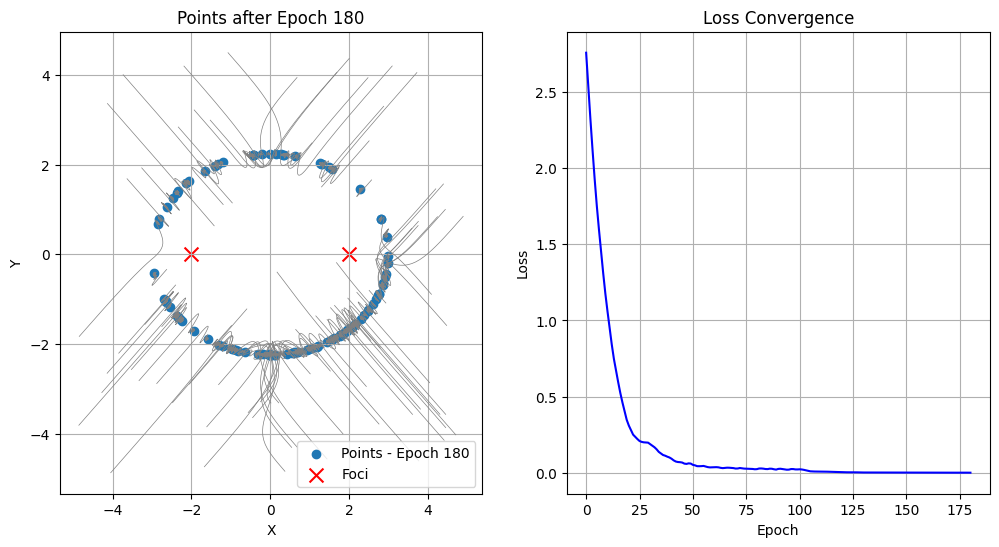

Epoch 180: Loss = 0.002188


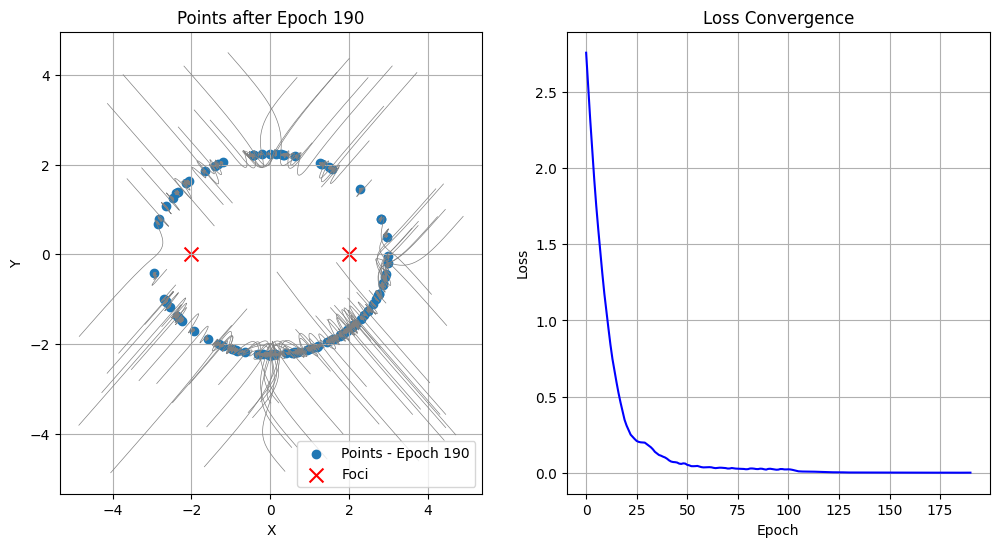

Epoch 190: Loss = 0.002411


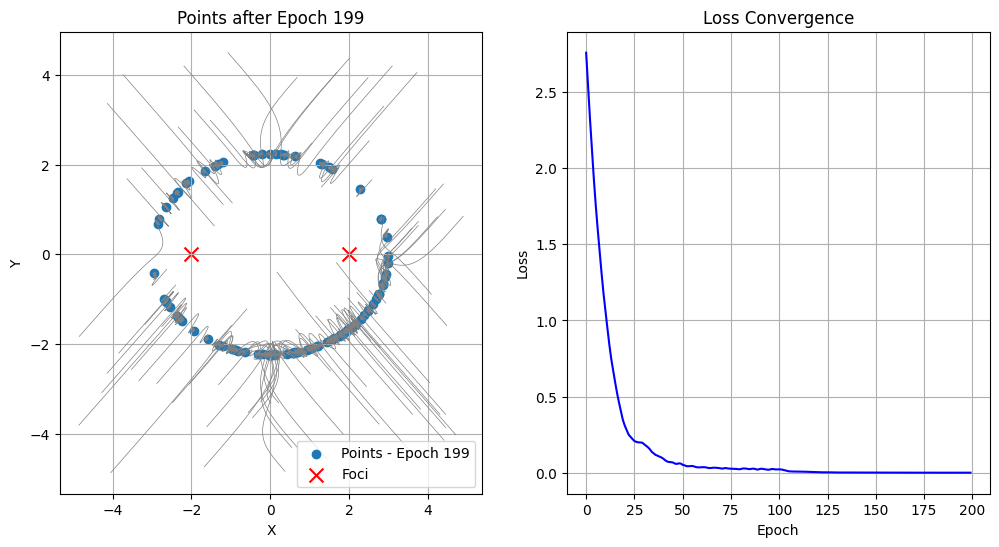

Elapsed time: 12.850662231445312 seconds


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.optim.lr_scheduler import StepLR


# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)
scheduler = StepLR(optimizer, step_size=100, gamma=0.1)


# Training loop
num_epochs = 200
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # Compute loss - it is implemented as MSE loss related to l_2 norm
    # TODO: your job is to replace the line below
    # with l_0, l_1 and l_infty - related loss
    loss = torch.mean(torch.abs(dist1 + dist2 - constant_sum))

    loss.backward()
    optimizer.step()
    scheduler.step()

    loss_history.append(loss.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 10th epoch
    if epoch % 10 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: Loss = {loss.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

# $L_\infty$ loss

$$\frac{dL_∞(ϵ)}{d\epsilon_i}=
\left\{\begin{array}{rl}
0 &\textrm{for $\epsilon_i \neq \max_i (ϵ_i) \lor ϵ_i=0 $} \\ \frac{ϵ_i}{|ϵ_i|} & \textrm{for $\epsilon_i = \max_i (ϵ_i) \land ϵ_i\neq 0$}
\end{array}\right .$$

As we can see it behaves like $l_1$ loss however instead of moving every point we only move the one with biggest loss. So the solution would be to have high learning rate at the beginning and then decrease it rapidly.

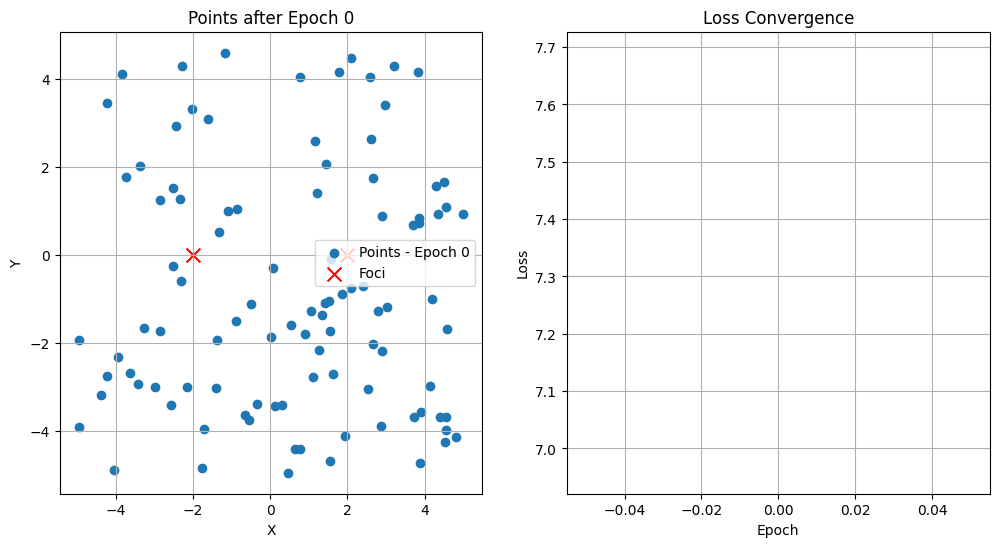

Epoch 0: Loss = 7.323938


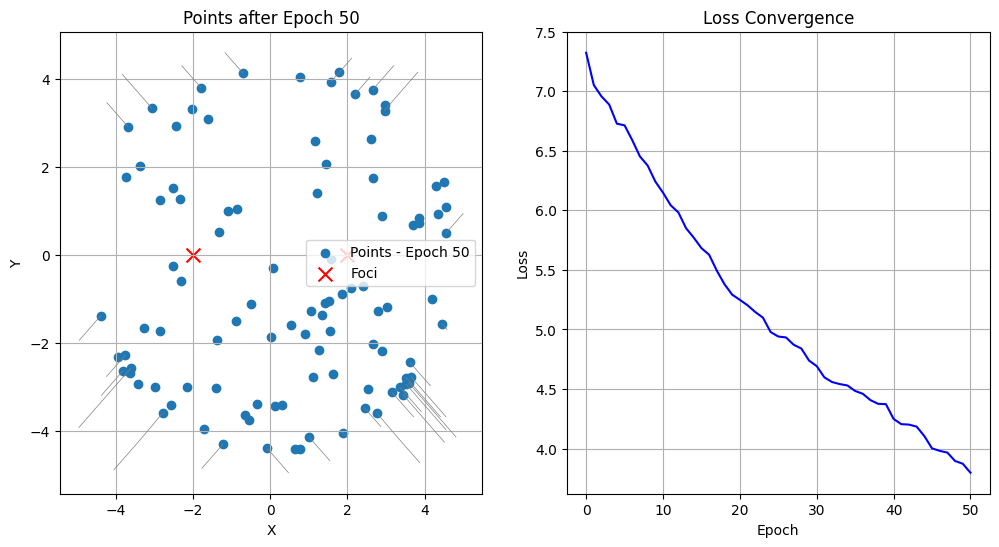

Epoch 50: Loss = 3.796906


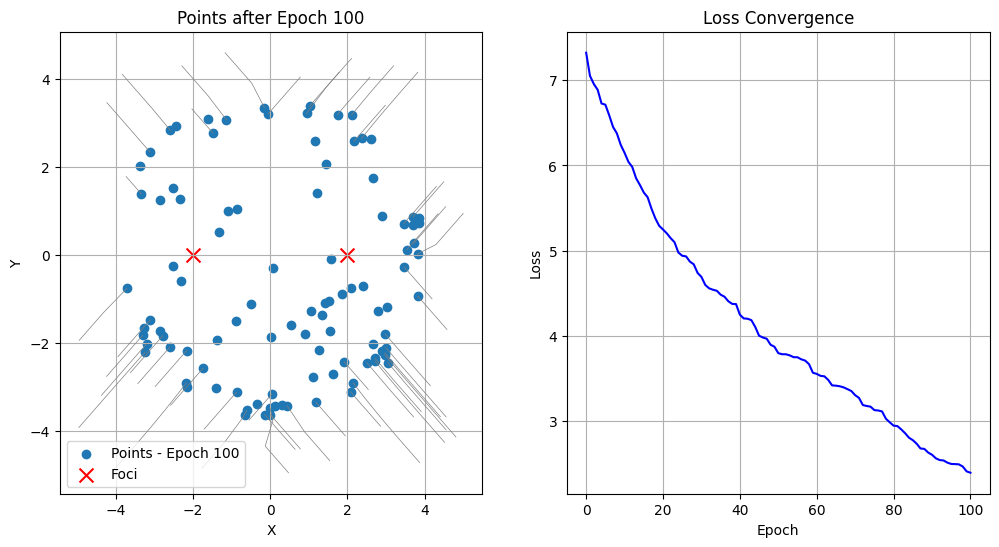

Epoch 100: Loss = 2.393175


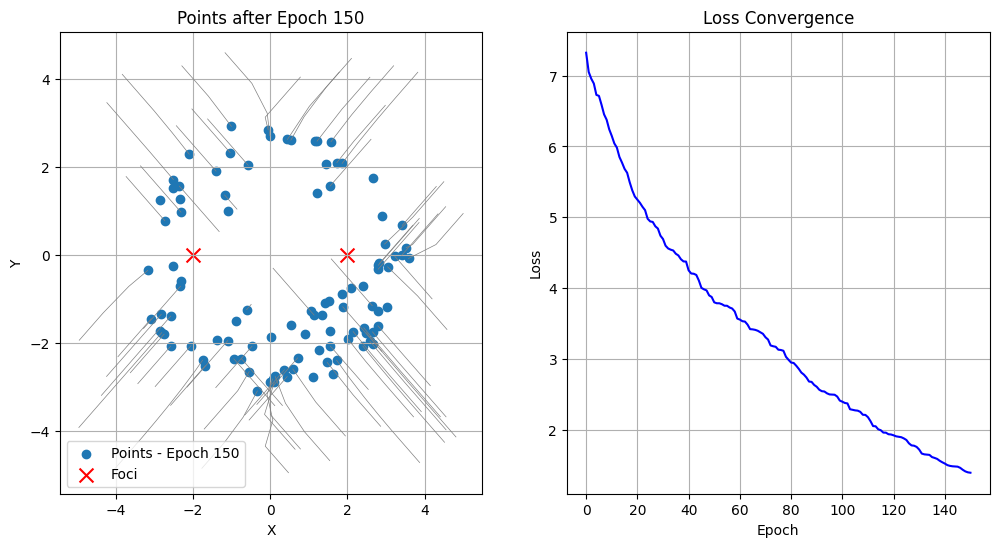

Epoch 150: Loss = 1.389654


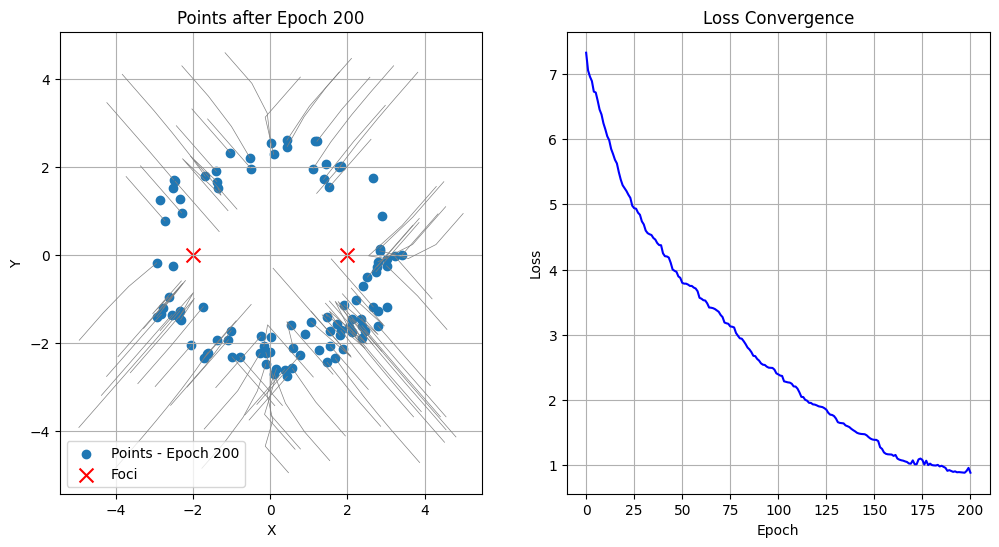

Epoch 200: Loss = 0.886059


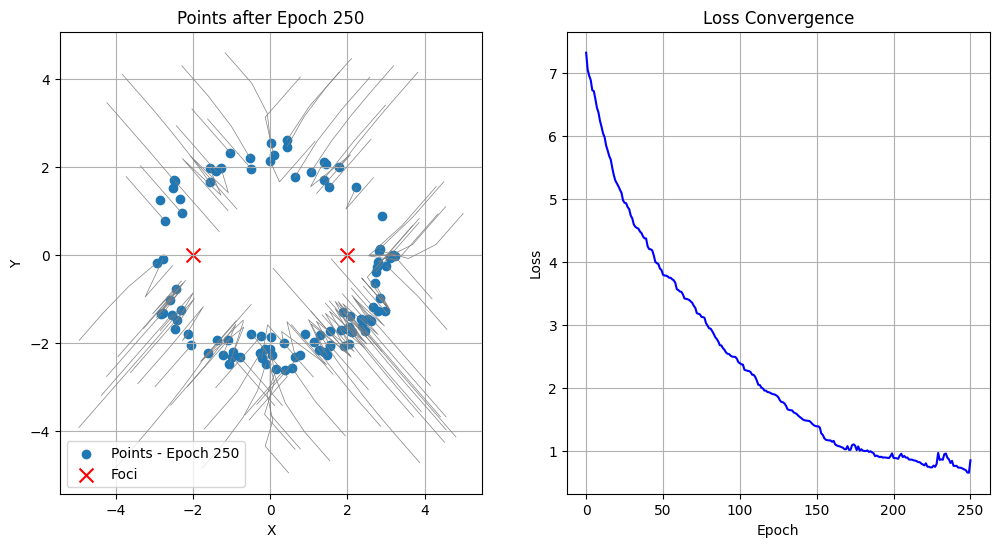

Epoch 250: Loss = 0.849135


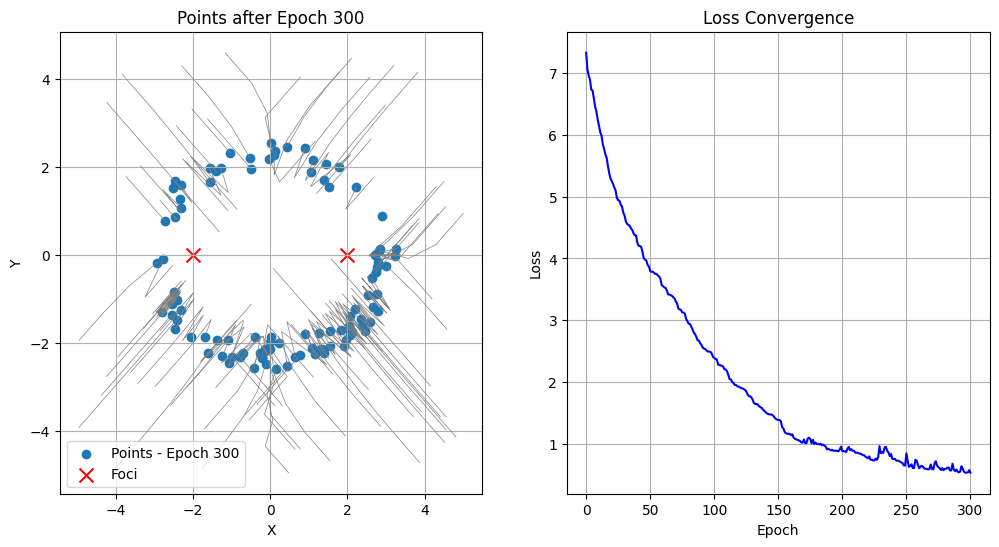

Epoch 300: Loss = 0.537401


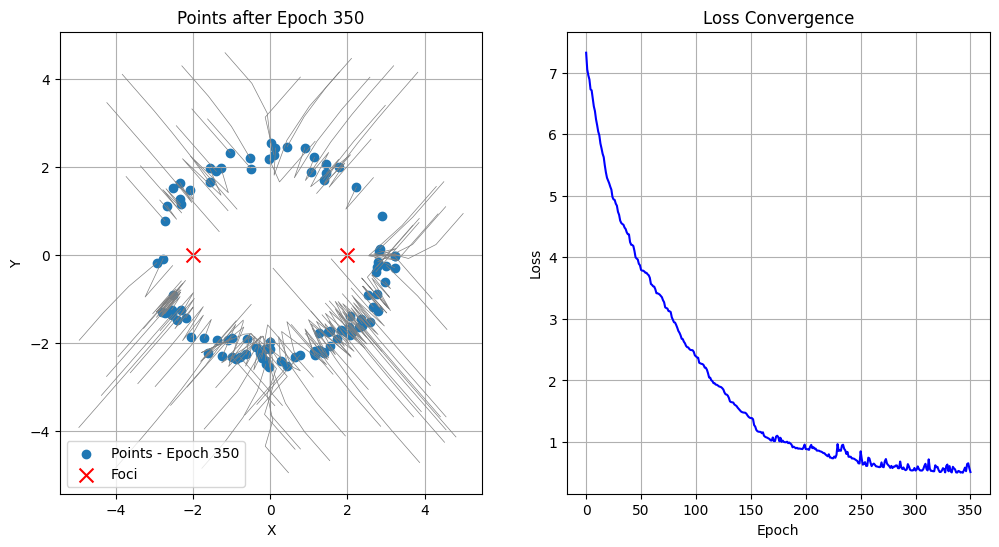

Epoch 350: Loss = 0.512818


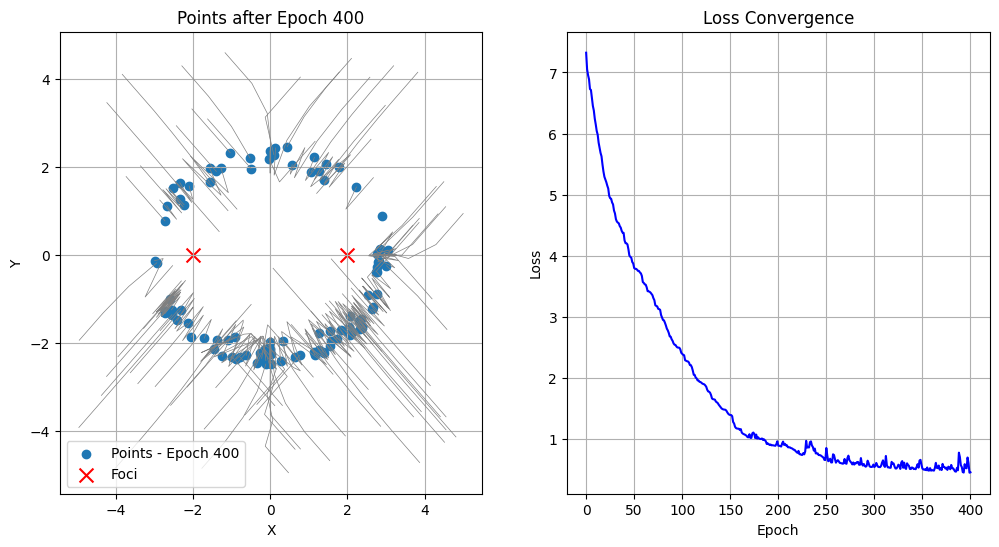

Epoch 400: Loss = 0.450674


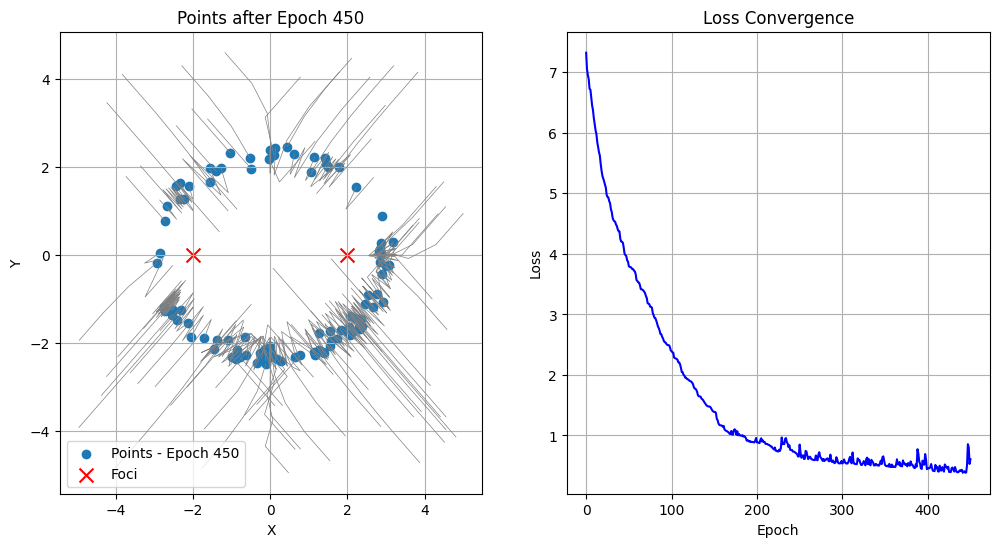

Epoch 450: Loss = 0.605150


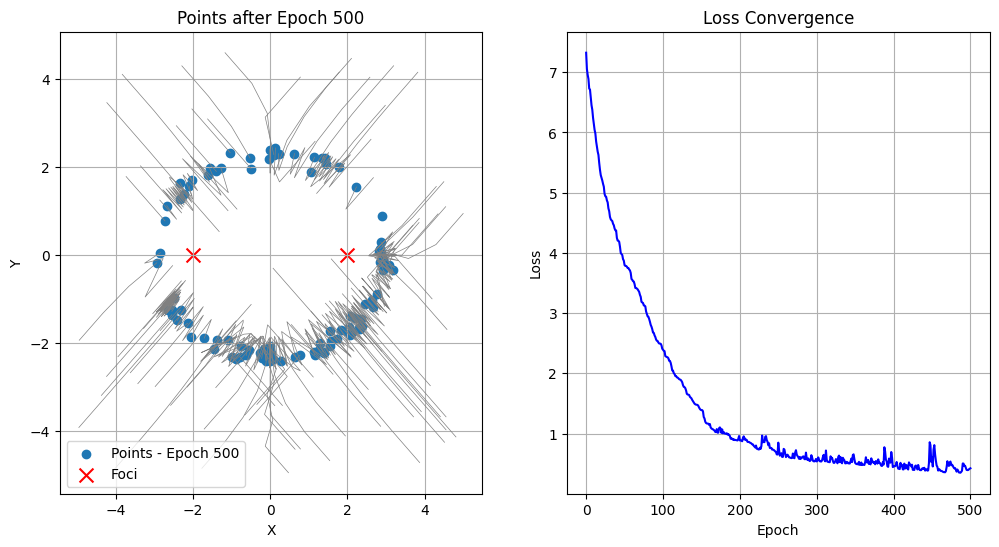

Epoch 500: Loss = 0.422950


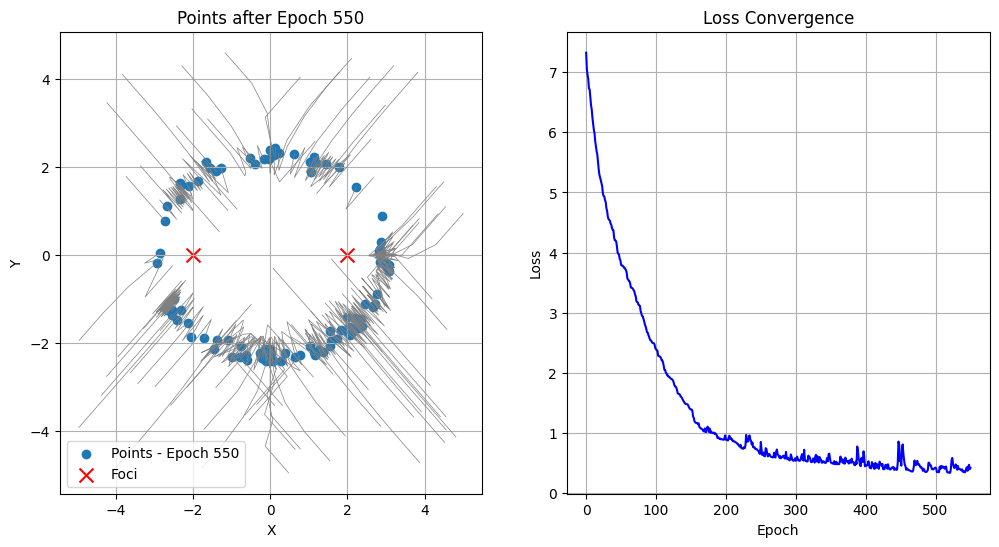

Epoch 550: Loss = 0.415530


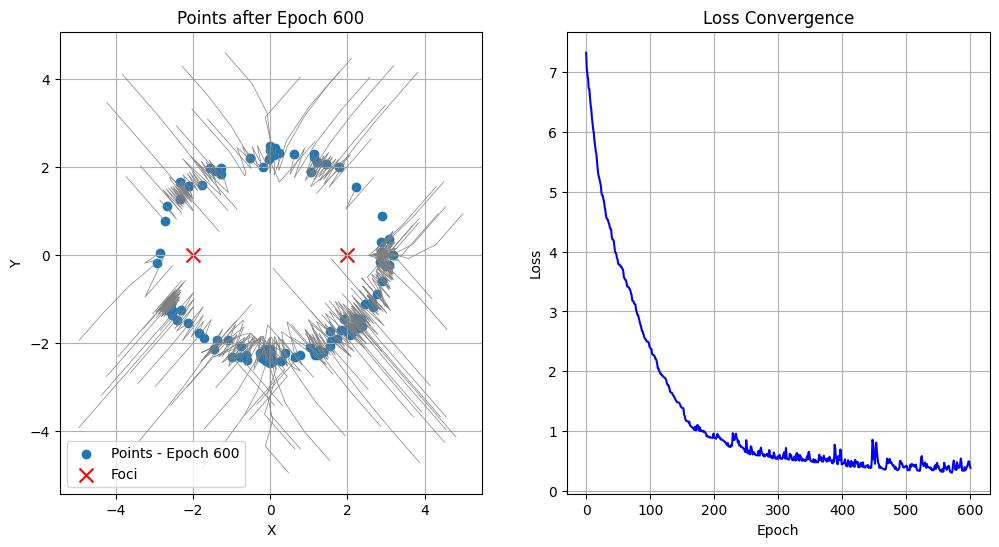

Epoch 600: Loss = 0.386727


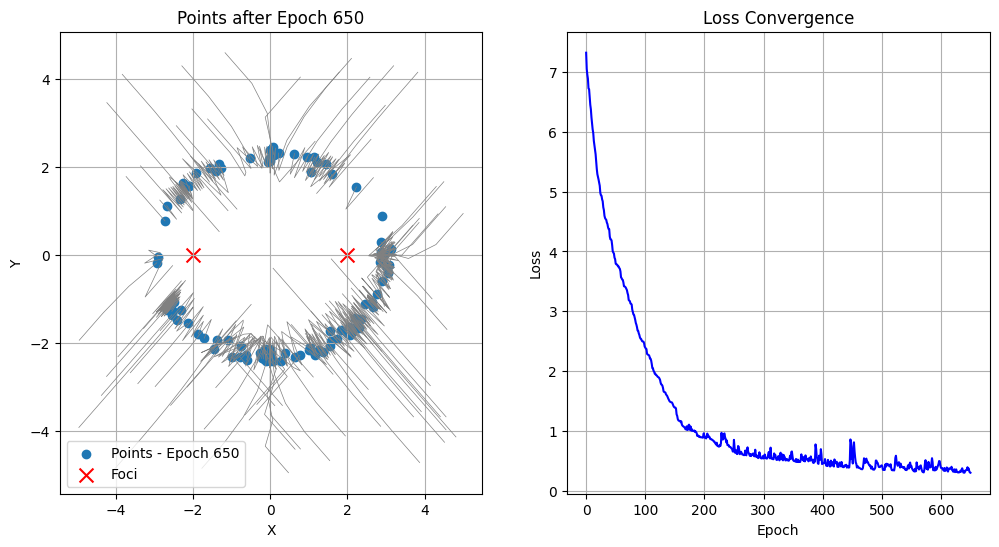

Epoch 650: Loss = 0.299376


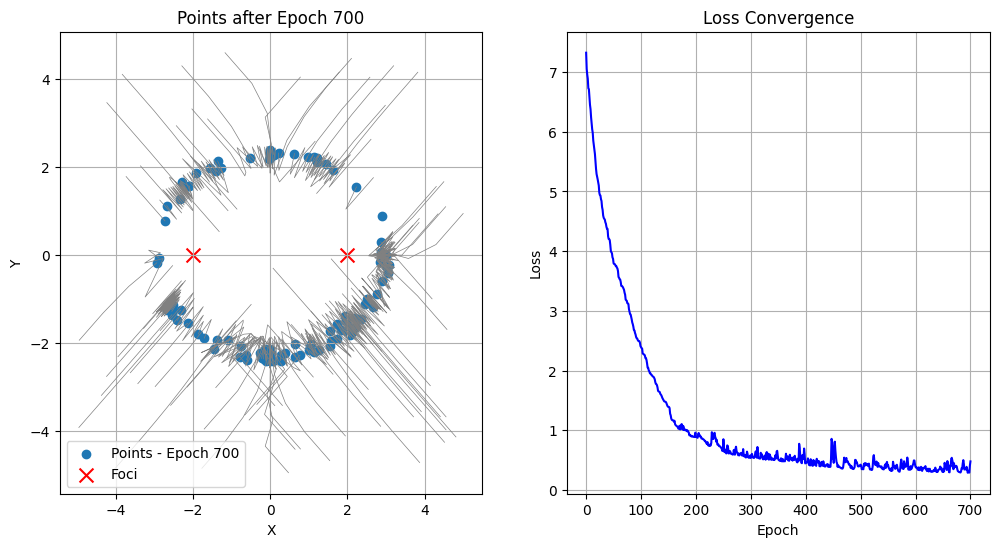

Epoch 700: Loss = 0.477610


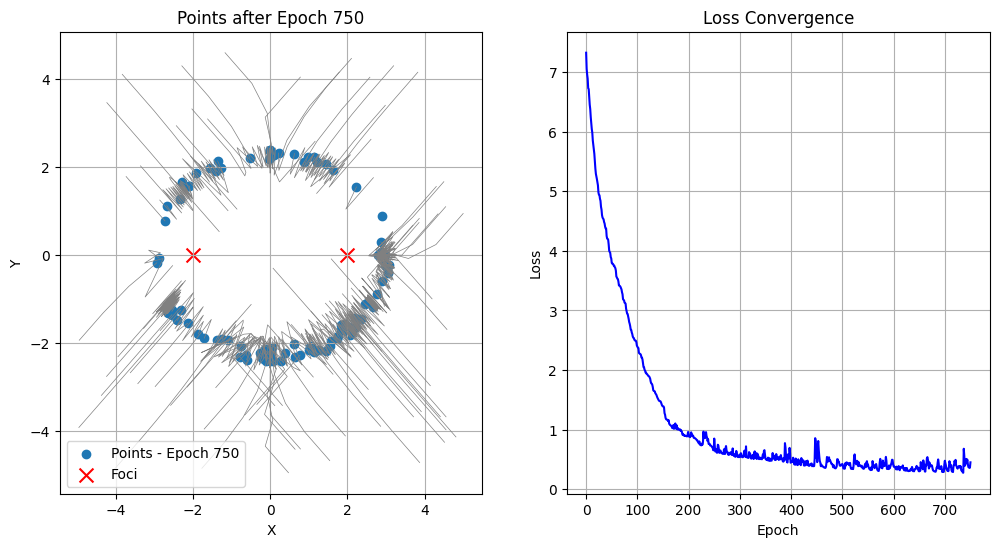

Epoch 750: Loss = 0.450883


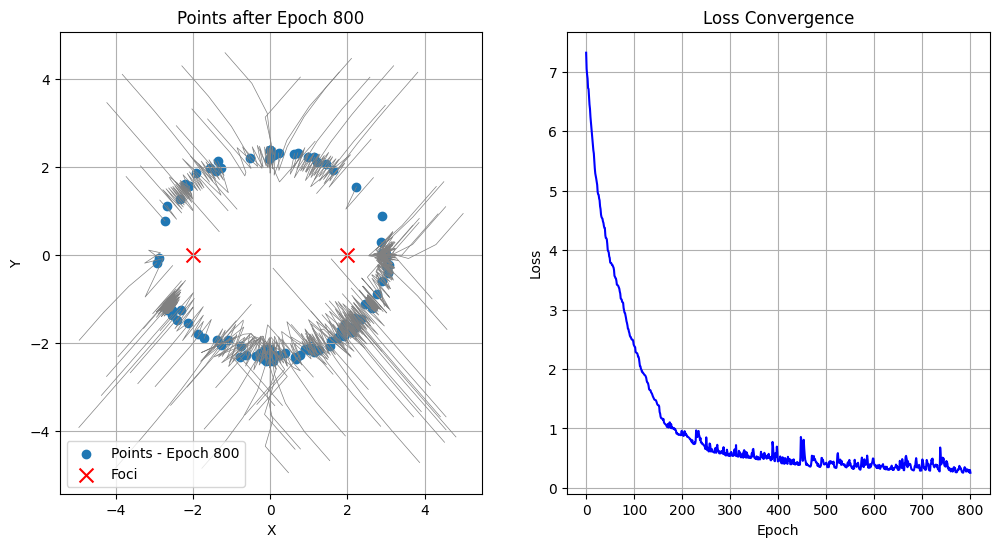

Epoch 800: Loss = 0.254017


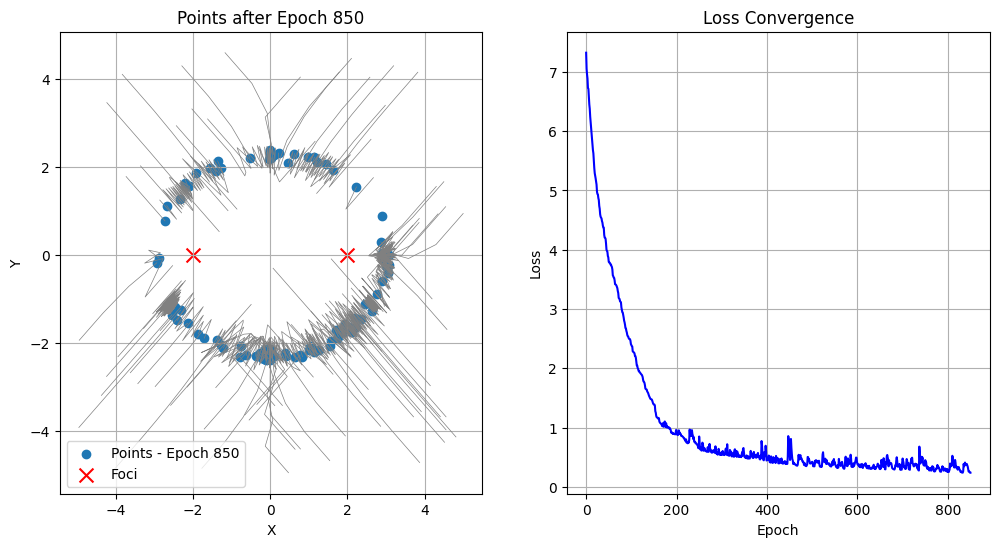

Epoch 850: Loss = 0.238534


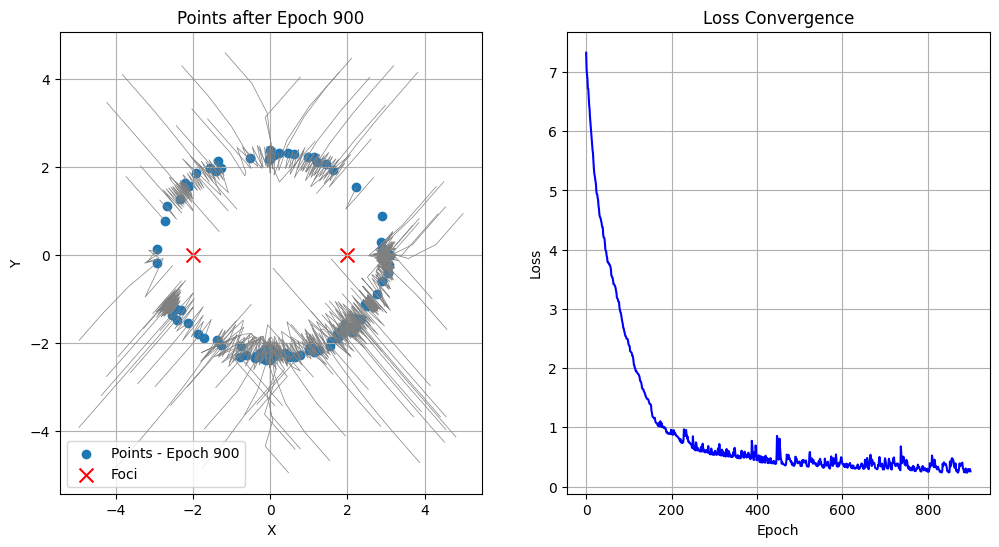

Epoch 900: Loss = 0.257051


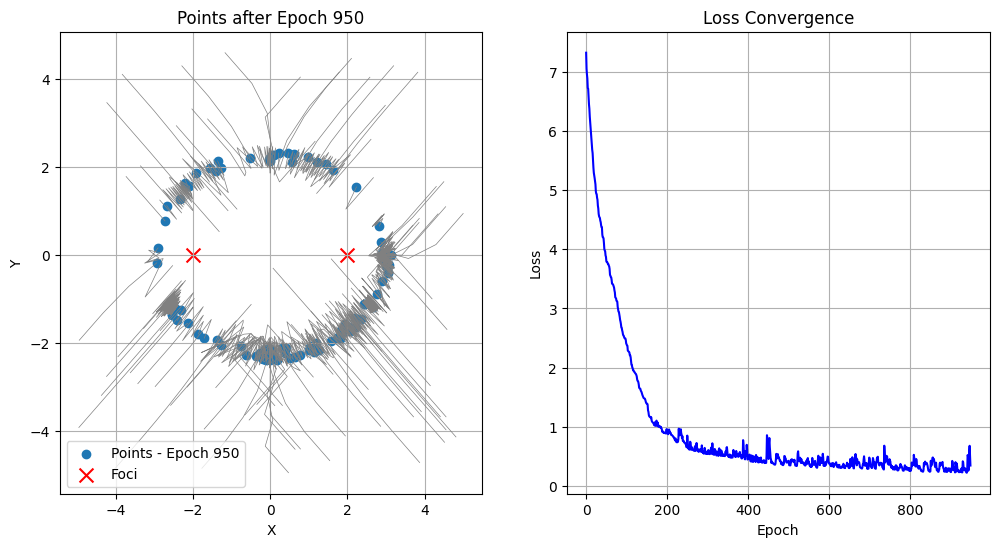

Epoch 950: Loss = 0.343328


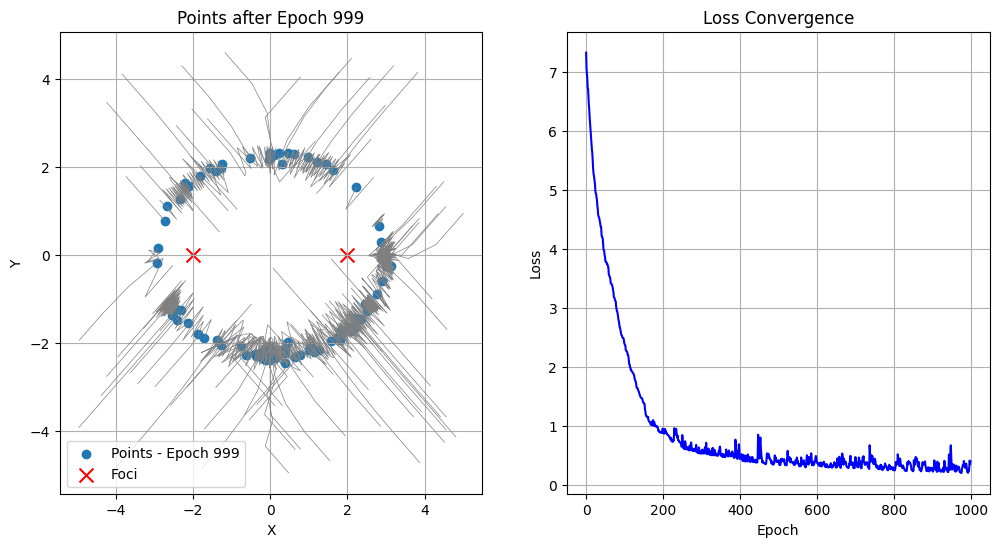

Elapsed time: 17.934505939483643 seconds


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np


# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)


# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # Compute loss - it is implemented as MSE loss related to l_2 norm
    # TODO: your job is to replace the line below
    # with l_0, l_1 and l_infty - related loss
    loss = torch.max(torch.abs(dist1 + dist2 - constant_sum))

    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 10th epoch
    if epoch % 50 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Loss = {loss.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")

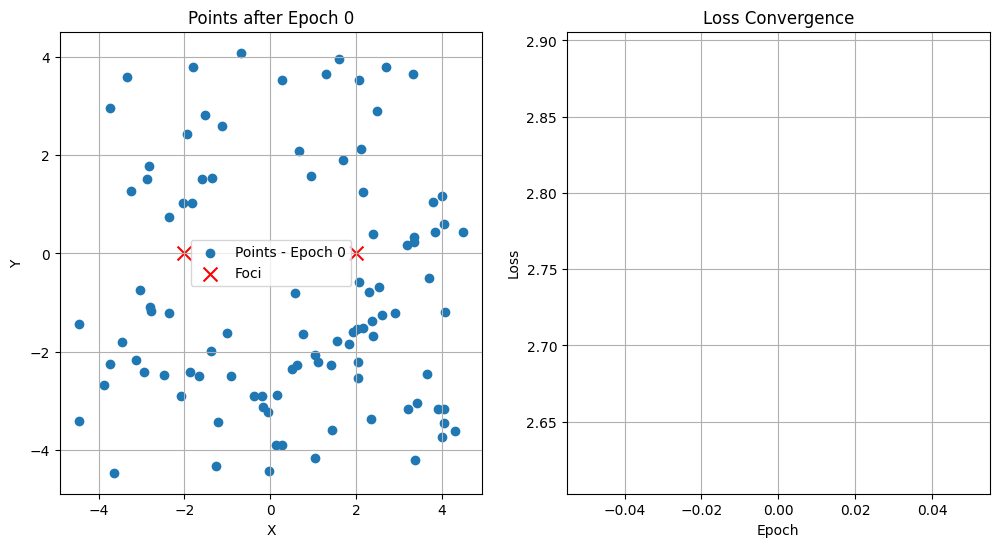

Epoch 0: Loss = 2.754212


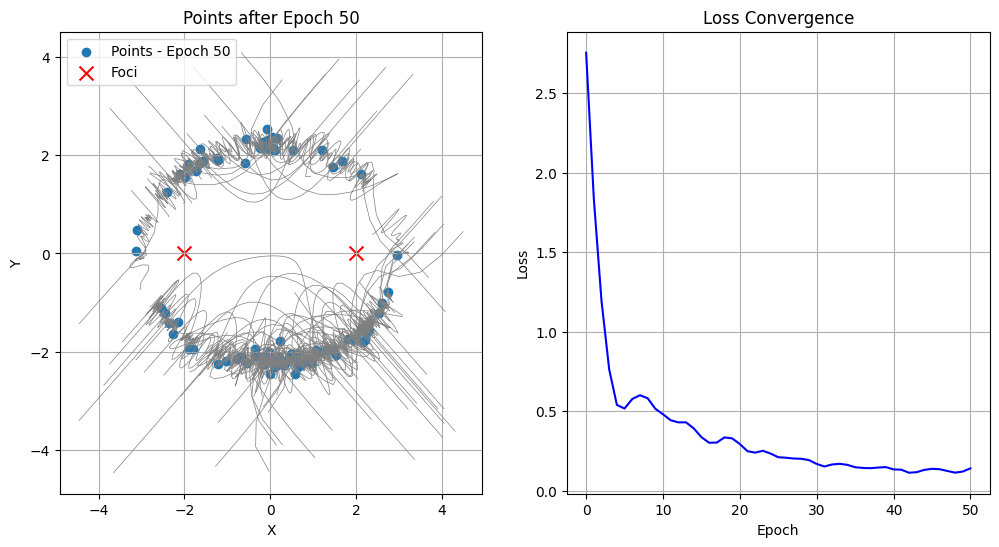

Epoch 50: Loss = 0.140540


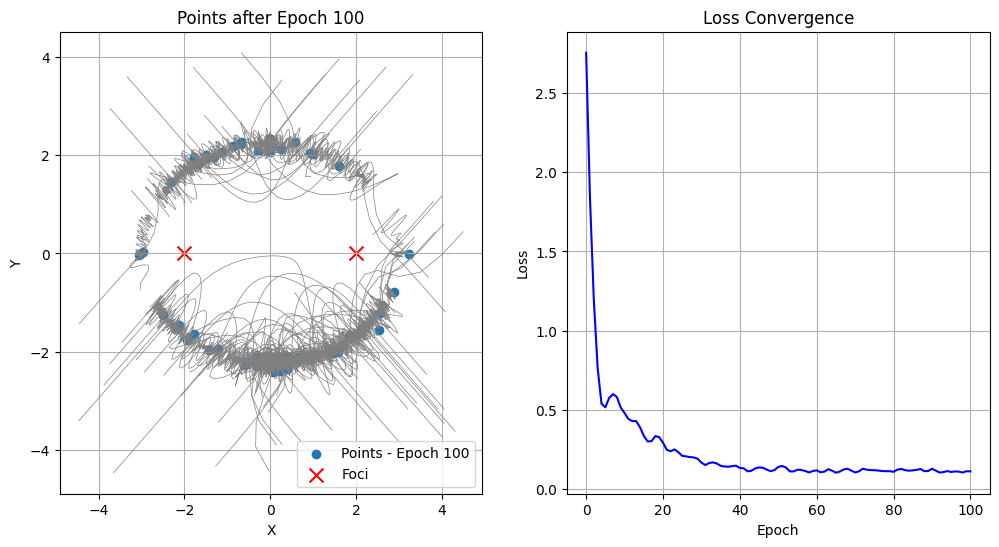

Epoch 100: Loss = 0.112576


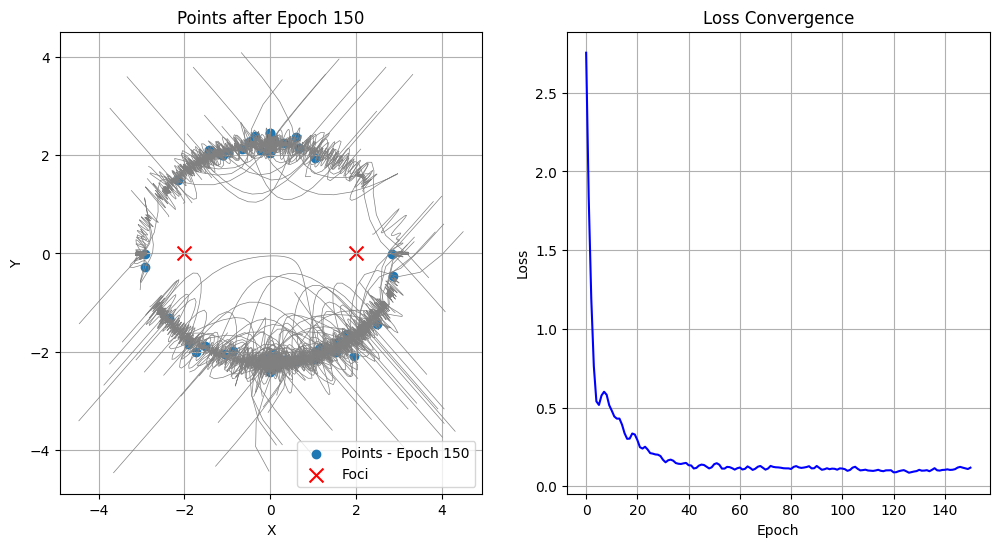

Epoch 150: Loss = 0.118283


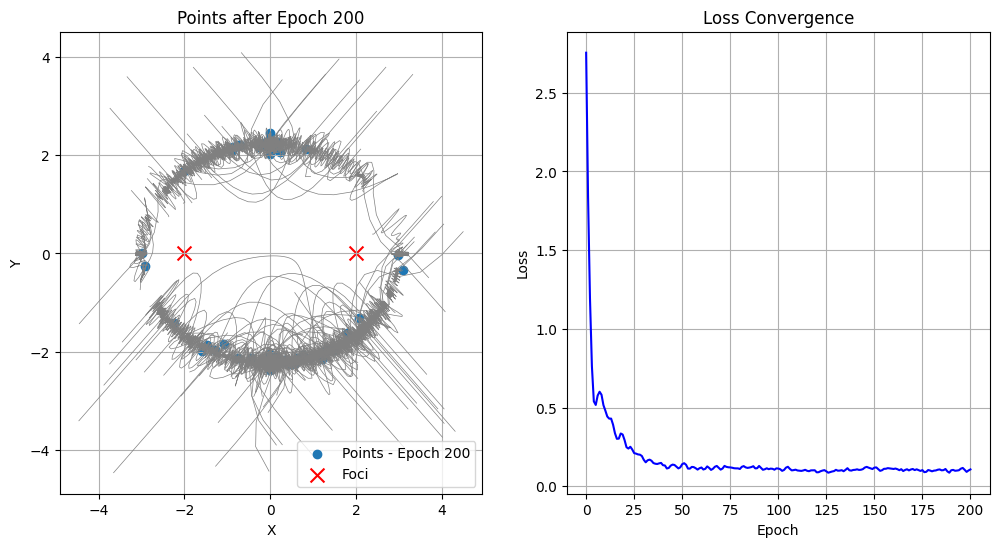

Epoch 200: Loss = 0.107051


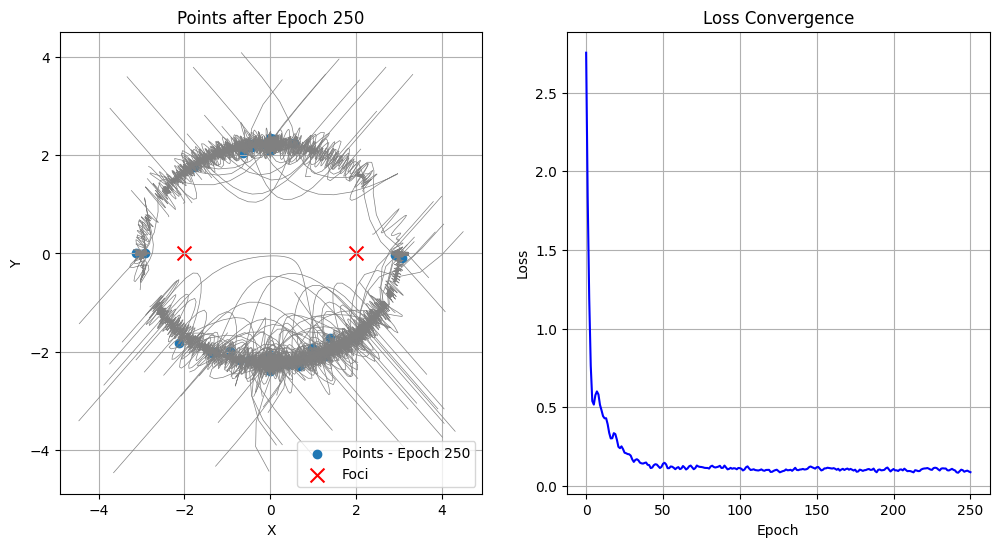

Epoch 250: Loss = 0.086795


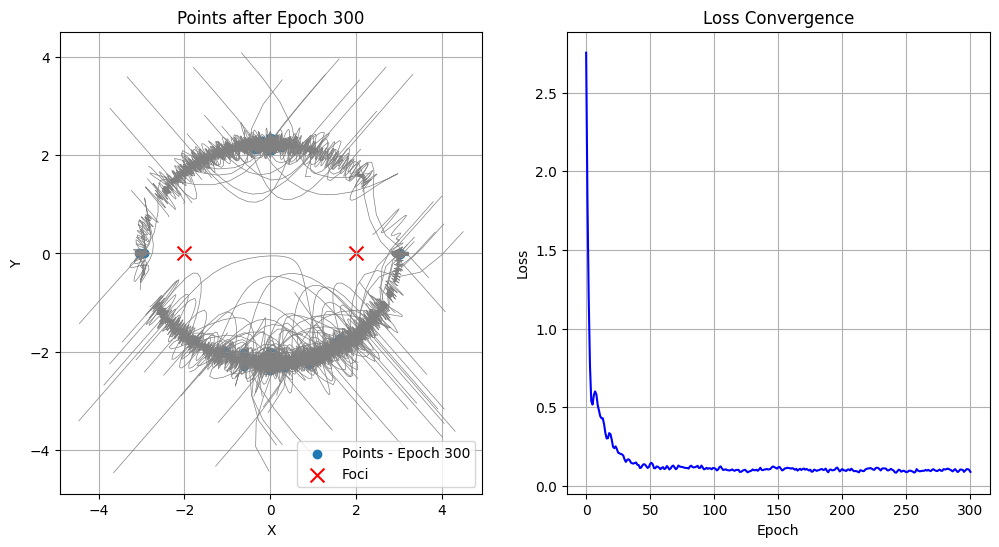

Epoch 300: Loss = 0.088758


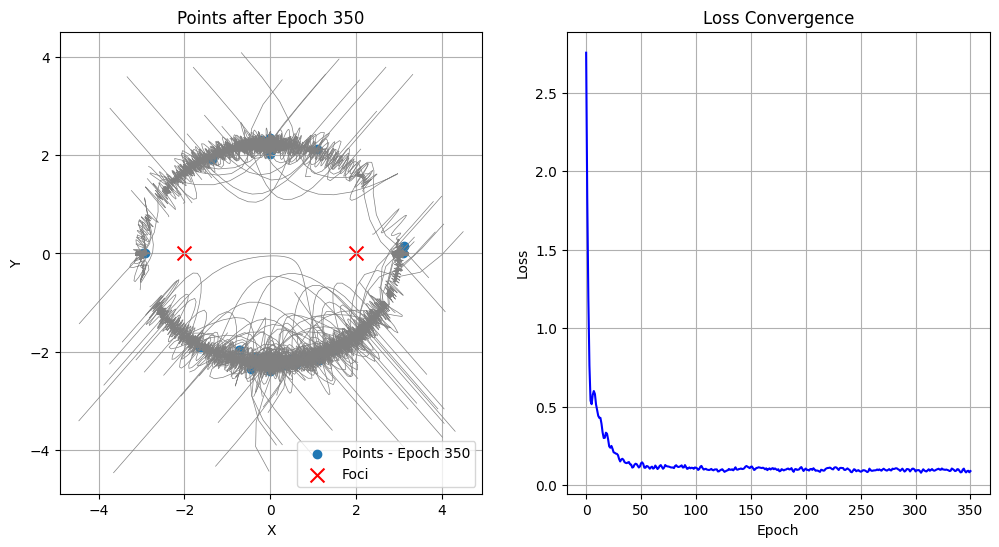

Epoch 350: Loss = 0.090893


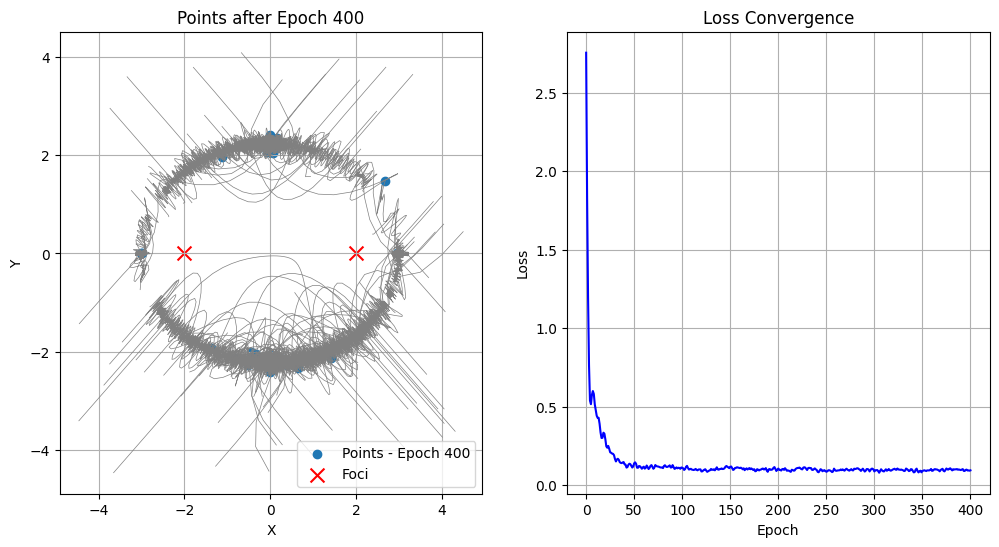

Epoch 400: Loss = 0.095540


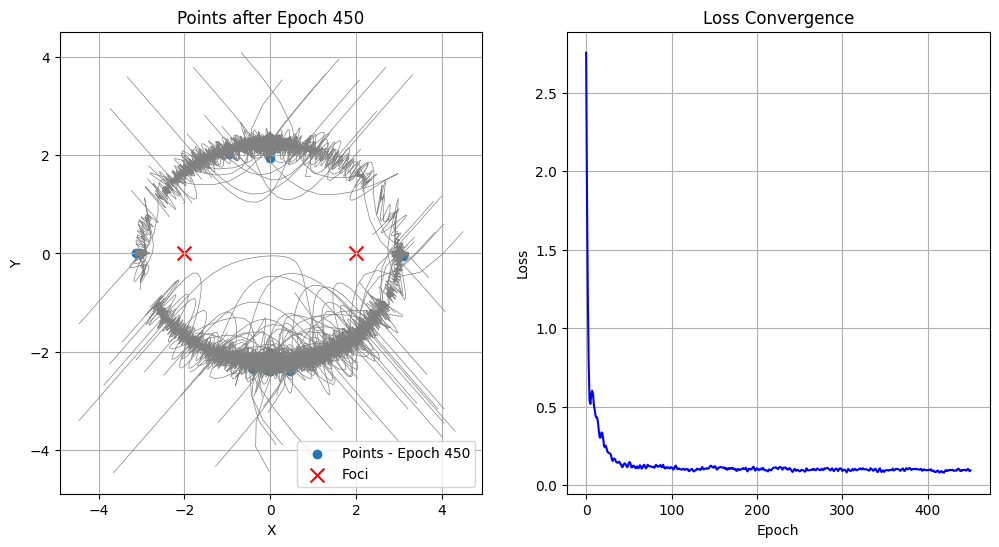

Epoch 450: Loss = 0.092609


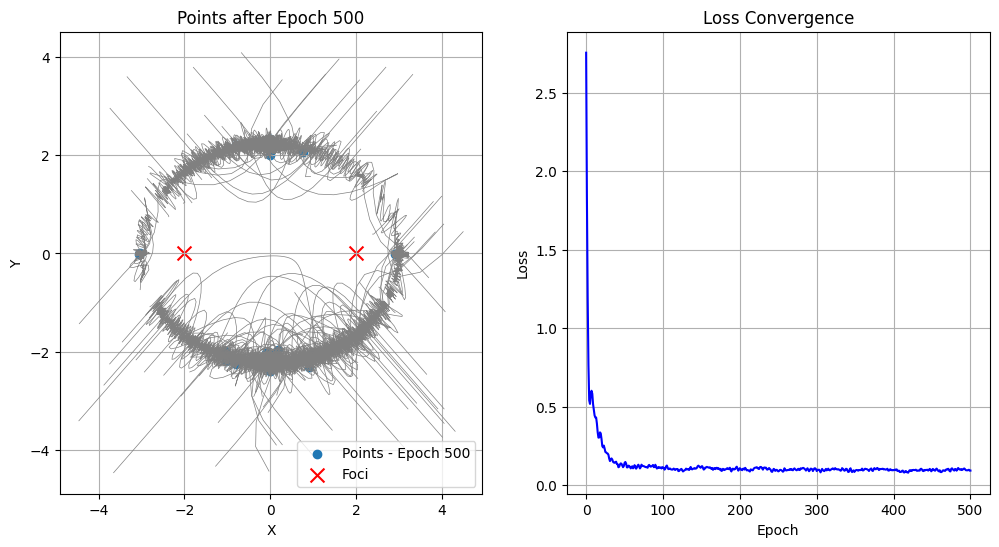

Epoch 500: Loss = 0.091706


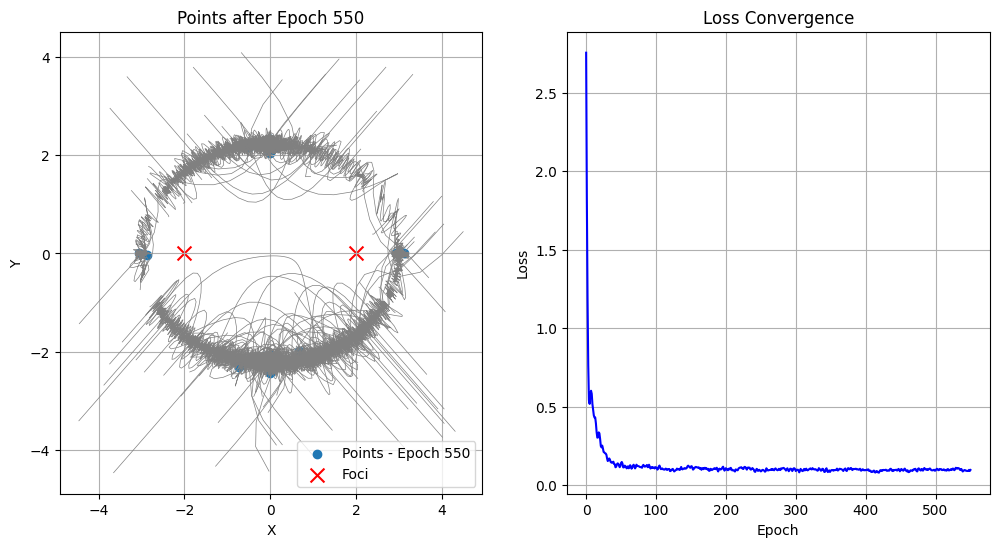

Epoch 550: Loss = 0.095745


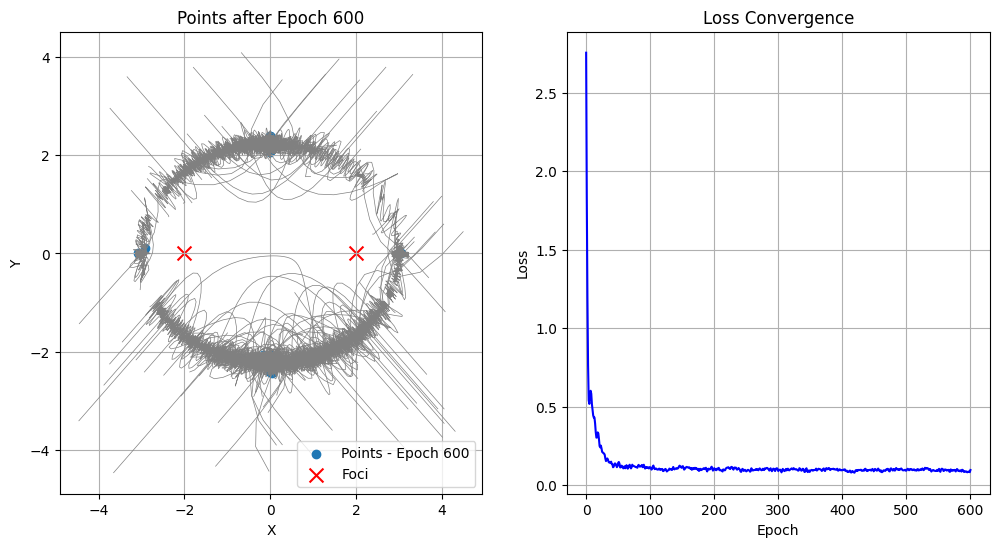

Epoch 600: Loss = 0.095537


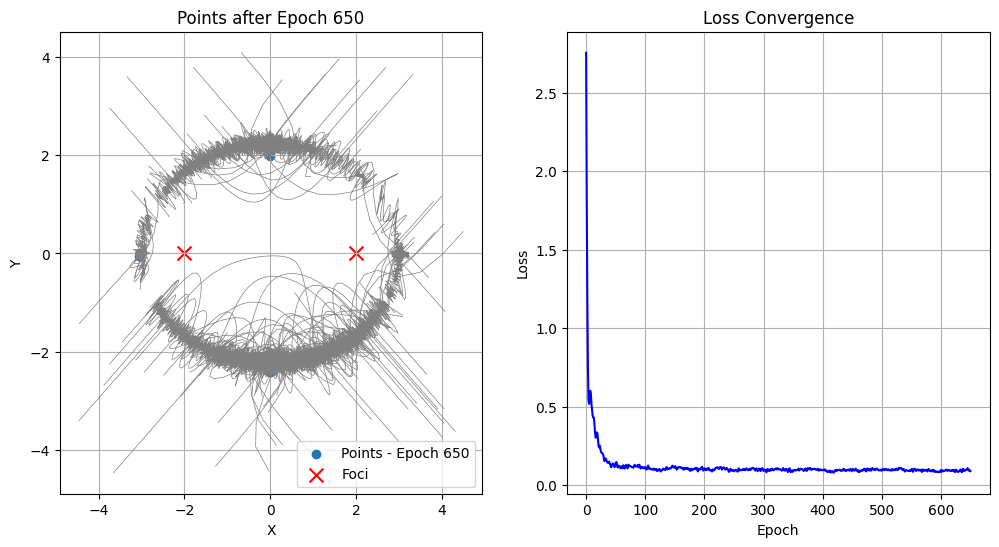

Epoch 650: Loss = 0.088157


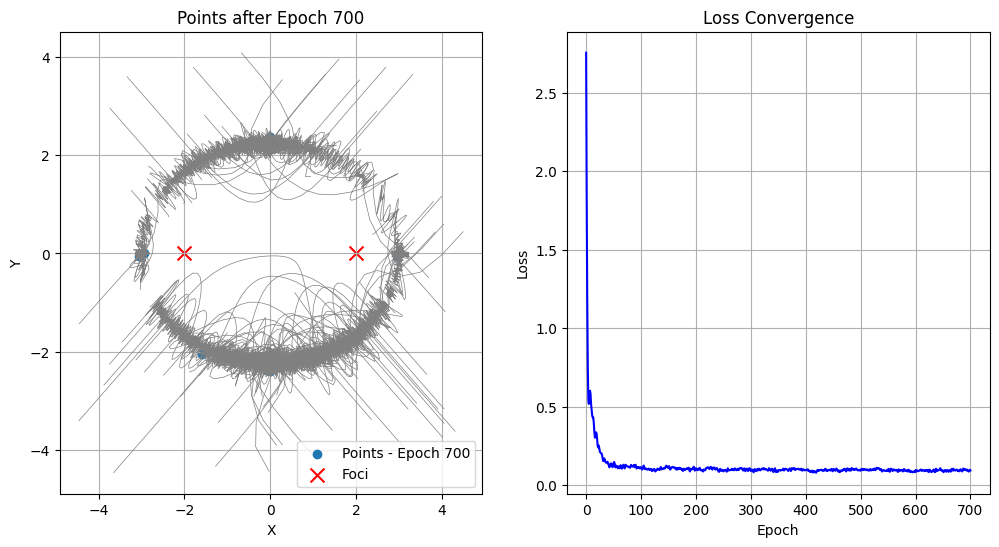

Epoch 700: Loss = 0.092587


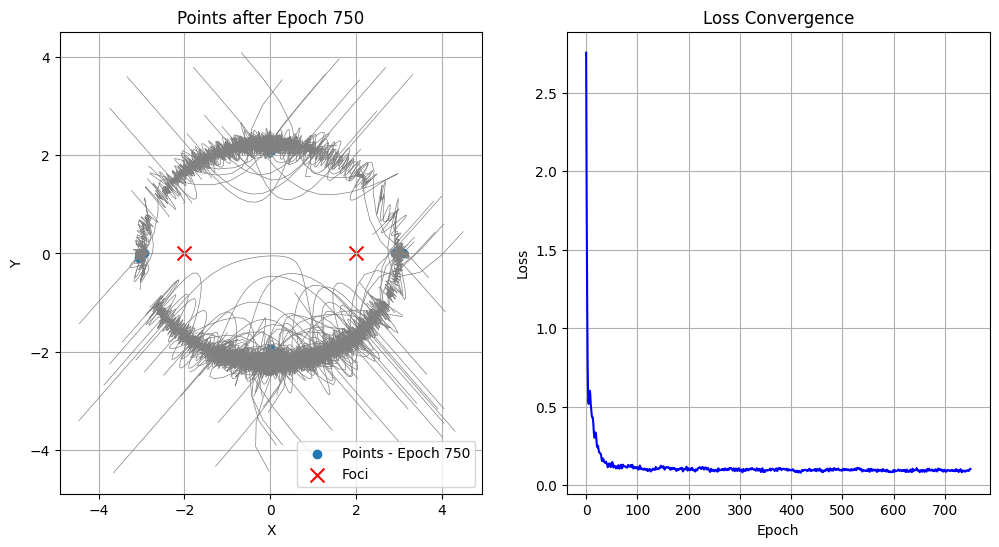

Epoch 750: Loss = 0.102272


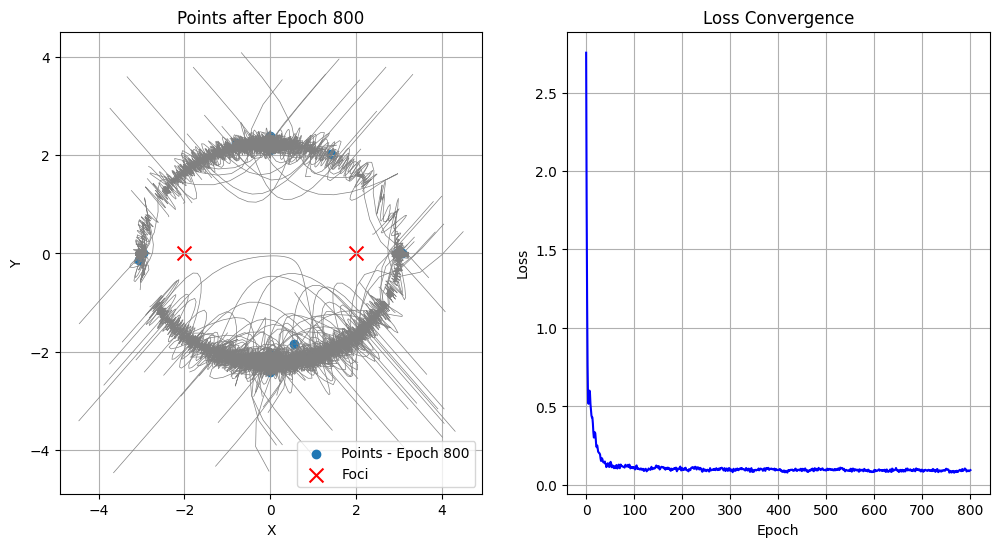

Epoch 800: Loss = 0.093935


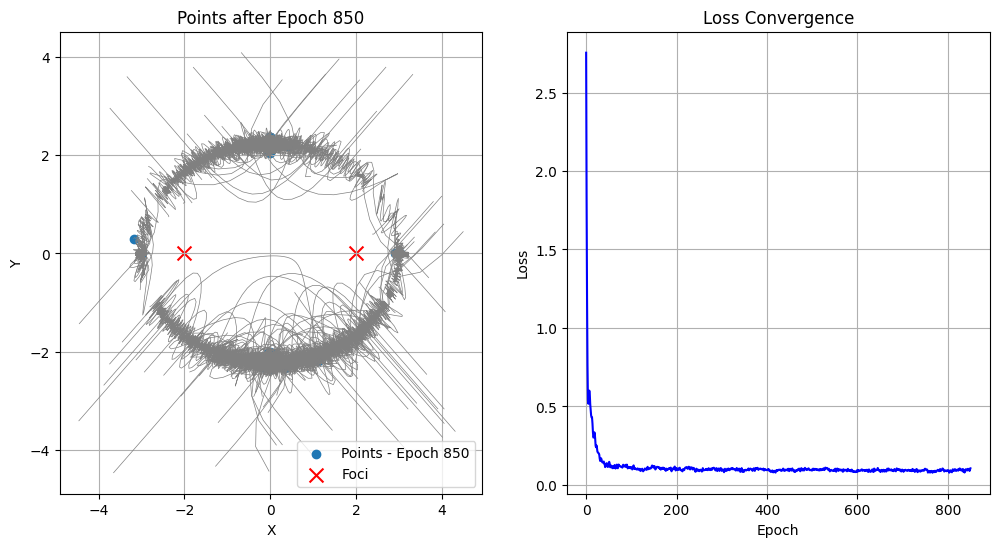

Epoch 850: Loss = 0.105225


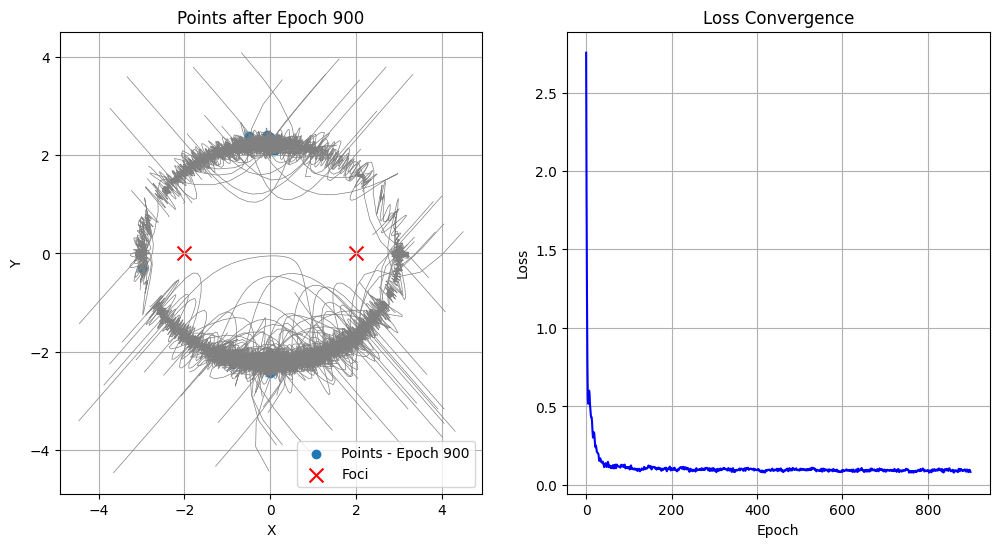

Epoch 900: Loss = 0.082029


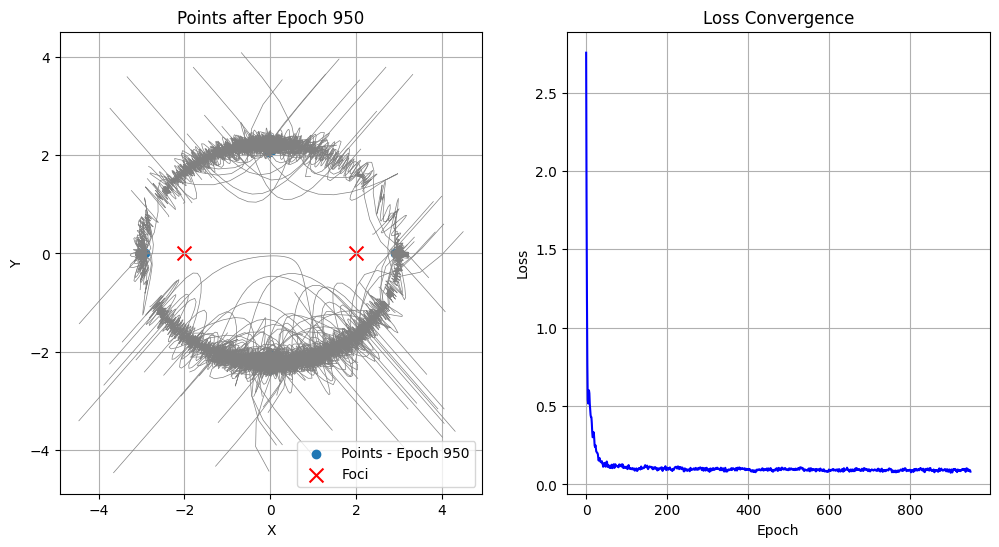

Epoch 950: Loss = 0.082022


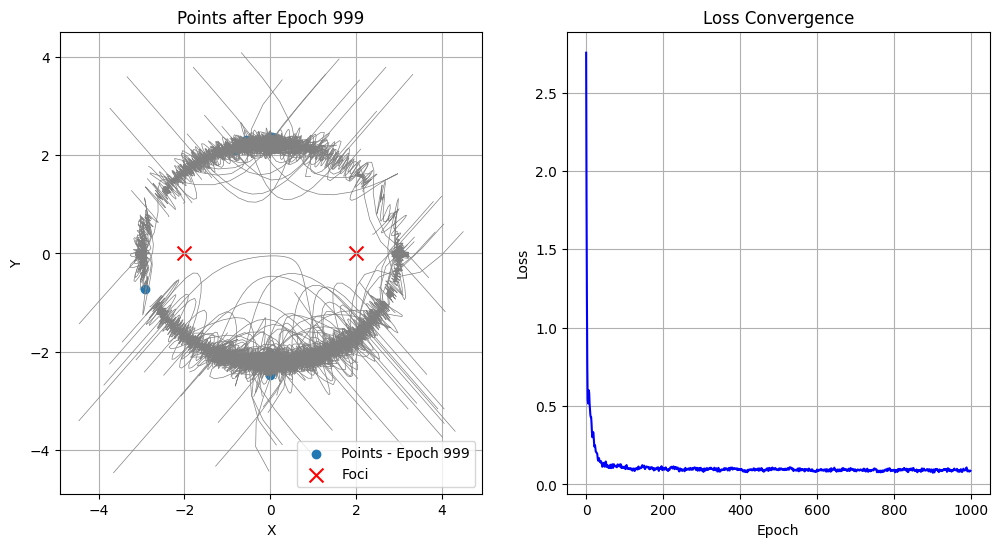

Elapsed time: 18.412180185317993 seconds


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.optim.lr_scheduler import StepLR

# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.5)
scheduler = StepLR(optimizer, step_size=100, gamma=0.2)



# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # Compute loss - it is implemented as MSE loss related to l_2 norm
    # TODO: your job is to replace the line below
    # with l_0, l_1 and l_infty - related loss
    loss = torch.mean(torch.abs(dist1 + dist2 - constant_sum))

    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 10th epoch
    if epoch % 50 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Loss = {loss.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")